# Módulo 3 — Visão Computacional e Modelos Generativos

## 🖼️ Fundamentos de Visão Computacional

<br>

---

---

Neste notebook vamos construir uma base sólida sobre como computadores entendem e processam imagens. 

Esse conhecimento é o alicerce para tudo que vem depois: CNNs, ViTs, GANs, detecção de objetos e deploy.

### Conteúdo
1. O que é Visão Computacional?
2. Representação digital de imagens (PIL e OpenCV)
3. NumPy para manipulação de imagens
4. Histograma, contraste e realce
5. Transformações geométricas e filtros
6. Operadores morfológicos

<br><br><br>

---

---


## 1. O que é Visão Computacional?

**Visão Computacional (Computer Vision / CV)** é a área da computação que estuda como fazer computadores *enxergarem* e *interpretarem* o mundo visual — imagens, vídeos, e representações 3D. Essa área atualmente é abrangida pelo campo da inteligência artificial.

Enquanto humanos interpretam imagens de forma instintiva e paralela, computadores precisam de representações matemáticas explícitas e algoritmos que extraiam significado a partir de números.


Diferente da análise digital de imagens, na visão computacional o objetivo e compreender o que ocorre na imagem, extrair informações, significado.


<img src="../images/visao_computacional_o_que_eh.png" width="700">


In [ ]:
# exibindo uma imagem
from PIL import Image, ImageOps
import numpy as np
import matplotlib.pyplot as plt
import cv2
img_pil = Image.open('../images/visao_computacional.png')
img_np = np.array(img_pil)
fig = plt.figure(figsize=(6, 4))
imgplot = plt.imshow(img_np)


<br><br><br>

---

---

### Visão Computacional: para que serve?

| Área | Exemplos de aplicação |
|---|---|
| Medicina | Diagnóstico por imagem (raios-X, ressonância, histopatologia) |
| Indústria | Controle de qualidade, detecção de defeitos |
| Segurança | Reconhecimento facial, detecção de atividade, monitoramento por câmeras |
| Veículos autônomos | Detecção de pedestres, sinais, faixas |
| Varejo | Checkout sem caixa, análise de gôndola |
| Agricultura | Detecção de pragas, estimativa de safra |

<br> 

Aplicações específicas em áreas periciais:

- reconhecimento de pessoas em imagens e vídeos (verificar se alguma pessoa está em um grande conjunto de imagens ou vídeos)

- classificação de imagens e vídeos ilegais (ex: imagens e vídeos de abuso sexual infantil)

- análise de gemas

- análise de imagens por satélite (dano ambiental, desmatamento, mineração ilegal, etc.)

- análise de obras de arte

- deepfakes

<br> <br> 

---

---



### Visão Computacional: Amplitude
 
- Visão computacional é um campo muito amplo

- A produção de imagens e vídeos sofreu um aumento exponencial nos últimos 25 anos

- Necessidade de organizar, buscar, ordenar, comparar ou extrair semântica de imagens e vídeos

- Pode impactar diversas áreas da sociedade (inclusive segurança pública)

- Está no centro da revolução de IA

- Implicações éticas (privacidade, estado de vigilância, representatividade, viéses)

- Necessidade de conhecer a linguagem da área

<br><br><br>

---

---


### Visão Computacional: pipeline clássica

<img src="../images/pipeline2.png" width="550">

Entender as etapas iniciais dessa pipeline — representação e pré-processamento — é um grande diferencial para realmente entender o que está acontecendo.


<br><br><br>

---

---


### Visão computacional: relacionamentos

<img src="../images/visao_computacional_relacoes.png" width=600>


<br><br><br>

---

---

### Visão computacional: qual o desafio?

<img src="../images/visao_computacional_imagem_vs_representacao.png" width=600>


<br><br><br>

---

---

## 2. Representação digital de imagens

Após processo de captura, as imagens são armazenadas em representações digitais. 

De forma simplificada, as imagens são armazenadas como pixels. 

<br><br>

---

---

### 2.1 Pixels

Uma imagem digital é uma **grade retangular de pixels** (*picture elements*). Cada pixel é a menor unidade de informação de uma imagem e armazena um valor de intensidade ou cor.


E cada imagem tem uma largura (width), altura (height) e canais (cores).

Uma imagem preto e branca (grayscale) é representada como uma matriz (a "Representação" da imagem acima).

As dimensões dela serão apenas (largura, altura). Aqui cada pixel é um valor de 0 a 255.
- 0: preto
- 255: branco
- valores intermediários são faixas entre preto e branco (cinza).

Uma imagem colorida, na representação RGB, tem as seguintes dimensões: (largura, altura, 3).

Cada pixel é composto por 3 valores (r, g, b).

Uma imagem colorida, na representação RGBA (imagens png), tem as seguintes dimensões: (largura, altura, 4).

Cada pixel é composto por 3 valores (r, g, b, a). O a (ou alpha) é um valor de opacidade do pixel.
Na prática, convertemos imagens RGBA para RGB.


<br><br><br>

---

---

### 2.2 Canais e espaços de cor

- **Grayscale (escala de cinza):** 1 canal. Cada pixel = 1 valor de intensidade [0, 255]. `shape: (H, W)`
- **RGB:** 3 canais — Red, Green, Blue. Cada pixel = 3 valores. `shape: (H, W, 3)`
- **RGBA:** 4 canais — RGB + Alpha (transparência). `shape: (H, W, 4)`
- **HSV:** Hue (matiz), Saturation (saturação), Value (brilho). Mais intuitivo para segmentar por cor.
- **BGR:** Mesma informação do RGB, mas ordem invertida. **Padrão do OpenCV** — atenção!
- **YUV** O espaço de cor YUV é um modelo que separa a informação de luminosidade (brilho) da informação de crominância (cor). 

Curiosidade: o esquema YUV foi criado originalmente para permitir que a televisão em cores fosse compatível com os aparelhos antigos em preto e branco. Veremos um exemplo de uso na equalização de imagens coloridas. No YUV, o Y (Luma) representa o brilho da imagem (a versão em escala de cinza), sendo o componente que o olho humano percebe com mais detalhes. O U (Crominância Azul) define a diferença entre a luz azul e a luminosidade e o V (Crominância Vermelha) define a diferença entre a luz vermelha e a luminosidade.

<br><br><br>

---

---


### 2.3 Profundidade de bits

A **profundidade de bits** define quantos valores distintos cada canal pode representar:

| Bits | Valores por canal | Tipo numpy | Uso |
|---|---|---|---|
| 8 bits | 0–255 | `uint8` | Imagens cotidianas (fotos, vídeo) |
| 16 bits | 0–65535 | `uint16` | Imagens médicas, astronomia |
| 32 bits float | 0.0–1.0 | `float32` | Processamento interno em redes neurais |


💡 **Atenção**:
Modelos de deep learning normalmente esperam tensores `float32` normalizados em [0, 1]. A conversão `uint8 → float32` é uma das primeiras etapas do pré-processamento.


<br><br><br>

---

---


### 2.4 Exemplos práticos

Dimensões da imagem: (275, 234)
Atenção: propriedade size do img_pil (de objetos criados com PIL.Image.open) retorna (Largura, Altura) 
----------------------------------------
Image.mode: L
----------------------------------------
A altura da imagem é 234 e a largura é 275


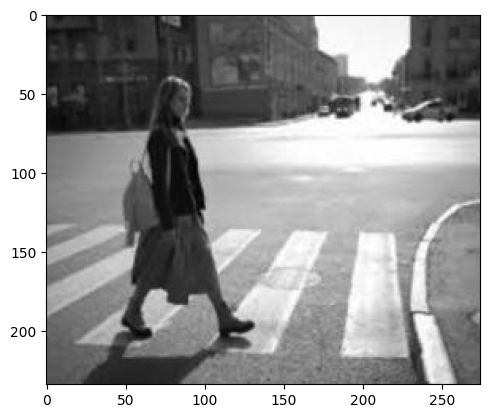

In [12]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# abrindo uma imagem (preto e branco) e mostrando suas dimensoes e modo 
img_pil = Image.open('../images/mulher_faixa_pedestre_pb.jpg')
# fig = plt.figure(figsize=(4, 4))
# plt.title("Mulher atravessando faixa de pedestre\n(preto e branco)")
# plt.xticks([])
# plt.yticks([])
plt.imshow(img_pil, cmap='gray')

print(f"Dimensões da imagem: {img_pil.size}")
print("Atenção: propriedade size do img_pil (de objetos criados com PIL.Image.open) retorna (Largura, Altura) ")
print(40*'-')
print(f"Image.mode: {img_pil.mode}")

print(40*'-')
# obtendo altura e largura da imagem
largura, altura = img_pil.size
print(f"A altura da imagem é {altura} e a largura é {largura}")


### Investigando a representação das imagens

In [2]:
# primeiro abrimos a imagem com PIL e exibimos suas dimensões (largura x altura)
img_pil = Image.open('../images/mulher_faixa_pedestre_pb.jpg')
print(f"Dimensões da imagem: {img_pil.size} (largura x altura)")
print(40*'-')

# agora convertemos para um array numpy
img_np = np.array(img_pil)
print(f"Dimensões da imagem: {img_np.shape} (altura x largura)")
print('>>> Observe que as dimensões aqui são invertidas.')
print('>>> No numpy a primeira dimensão é altura e a segunda é largura')


Dimensões da imagem: (275, 234) (largura x altura)
----------------------------------------
Dimensões da imagem: (234, 275) (altura x largura)
>>> Observe que as dimensões aqui são invertidas.
>>> No numpy a primeira dimensão é altura e a segunda é largura


In [6]:
# a função abaixo: 
# - cria objeto numpy.ndarray a partir da imagem PIL (obtém a representação da imagem / pixels)
# - exibe dimensões da representação da imagem 
# - imprime uma fatia da imagem (10 de altura e 12 de largura)
def exibe_dimensao_e_conteudo(img, offset_altura=10, offset_largura=12):
    img_np = np.array(img)
    print(f"Dimensões da imagem: {img_np.shape}")
    # fatiamento (slicing) usando numpy
    print(img_np[0:offset_altura, 0:offset_largura])


In [4]:
# exibindo uma parte da imagem
img_pil = Image.open('../images/mulher_faixa_pedestre_pb.jpg')
exibe_dimensao_e_conteudo(img_pil)

Dimensões da imagem: (234, 275)
[[57 58 58 54 46 38 33 30 31 32 35 41]
 [58 59 59 55 48 39 33 30 29 31 36 43]
 [59 61 62 58 50 41 34 30 29 32 39 47]
 [60 63 64 61 53 44 37 33 34 38 45 52]
 [61 63 64 62 56 48 42 39 43 47 52 57]
 [60 62 64 62 57 52 49 47 52 55 58 59]
 [59 61 62 61 58 56 55 55 58 60 61 60]
 [58 60 61 60 58 58 59 60 61 62 62 59]
 [50 51 52 51 50 49 49 51 56 56 54 51]
 [36 37 38 37 35 35 36 37 40 41 41 39]]


Dimensões da imagem: (234, 275)
[[  0   0   0   0   0   0 255 255 255 255 255 255]
 [  0   0   0   0   0   0 255 255 255 255 255 255]
 [  0   0   0   0   0   0 255 255 255 255 255 255]
 [  0   0   0   0   0   0 255 255 255 255 255 255]
 [  0   0   0   0   0   0 255 255 255 255 255 255]
 [  0   0   0   0   0   0 255 255 255 255 255 255]
 [  0   0   0   0   0   0 255 255 255 255 255 255]
 [  0   0   0   0   0   0 255 255 255 255 255 255]
 [  0   0   0   0   0   0 255 255 255 255 255 255]
 [  0   0   0   0   0   0 255 255 255 255 255 255]]


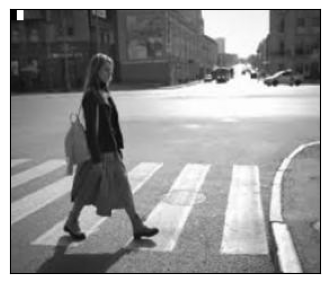

In [5]:
# alterando valor de pixels
img_pil = Image.open('../images/mulher_faixa_pedestre_pb.jpg')
img_np = np.array(img_pil)
# coloca um quadrado preto 10x6 no canto superior esquerdo
img_np[0:10, 0:6] = 0
# coloca um quadrado branco 10x6 no canto superior esquerdo logo depois do quadrado preto
img_np[0:10, 6:12] = 255
exibe_dimensao_e_conteudo(img_np, offset_altura=10, offset_largura=12)
# exibe_dimensao_e_conteudo(img_np, offset_altura=12, offset_largura=14)
fig = plt.figure(figsize=(4, 4))
plt.xticks([])
plt.yticks([])
fig = plt.imshow(img_np, cmap='gray')

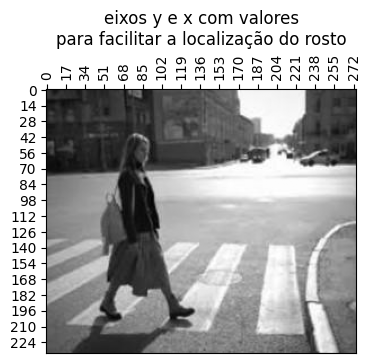

In [6]:
# exibição com referência de pixels
img_pil = Image.open('../images/mulher_faixa_pedestre_pb.jpg')
fig = plt.figure(figsize=(4, 4))
ax = fig.add_subplot(111)
ax.xaxis.set_ticks_position('top')
largura, altura = img_pil.size
steps_largura = range(0, largura, int(largura/16))
steps_altura = range(0, altura, int(altura/16))
plt.title("eixos y e x com valores\npara facilitar a localização do rosto")
plt.xticks(steps_largura, rotation=90)
plt.yticks(steps_altura)
fig = plt.imshow(img_pil, cmap='gray')

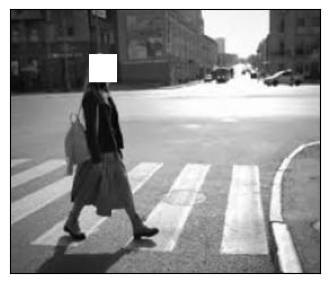

In [7]:
img_pil = Image.open('../images/mulher_faixa_pedestre_pb.jpg')
fig = plt.figure(figsize=(4, 4))
plt.xticks([])
plt.yticks([])
img_np = np.array(img_pil)
img_np[40:65, 70:95] = 255
fig = plt.imshow(img_np, cmap='gray')


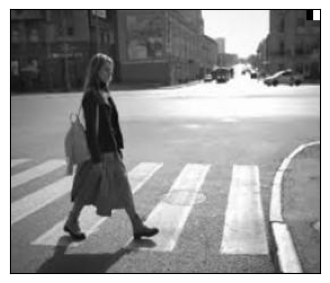

In [8]:
# alterando no canto superior esquerdo (um quadrado preto 10x6 seguido de um quadrado branco 10x6)
img_pil = Image.open('../images/mulher_faixa_pedestre_pb.jpg')
img_np = np.array(img_pil)
altura = img_np.shape[0]
largura = img_np.shape[1]
img_np[0:10, largura-12:largura-6] = 0
img_np[0:10, largura-6:largura] = 255
fig = plt.figure(figsize=(4, 4))
plt.xticks([])
plt.yticks([])
fig = plt.imshow(img_np, cmap='gray')

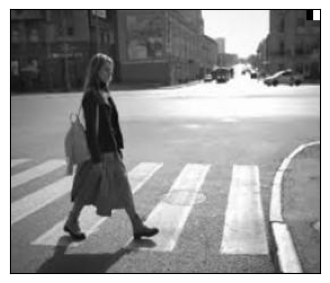

In [9]:
# Uma forma equivalente de fazer a última alteração
# com base no código da última célula
img_pil = Image.open('../images/mulher_faixa_pedestre_pb.jpg')
img_np = np.array(img_pil)
# altura = img_np.shape[0]
# largura = img_np.shape[1]
# img_np[0:10, largura-12:largura-6] = 0
# img_np[0:10, largura-6:largura] = 255
img_np[0:10, -12:-6] = 0
img_np[0:10, -6:] = 255
fig = plt.figure(figsize=(4, 4))
plt.xticks([])
plt.yticks([])
fig = plt.imshow(img_np, cmap='gray')


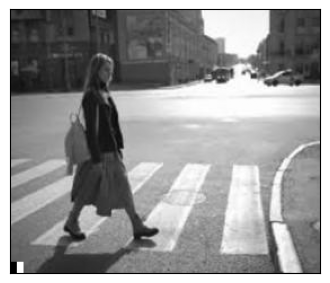

In [12]:
# exercício > insira um quadrado branco 10x6 seguido de um quadrado preto 10x6 no canto inferior esquerdo da imagem 
img_pil = Image.open('../images/mulher_faixa_pedestre_pb.jpg')
img_np = np.array(img_pil)
# altere apenas as 2 linhas abaixo
img_np[altura-10:altura, 0:6] = 0
img_np[altura-10:altura, 6:12] = 255

fig = plt.figure(figsize=(4, 4))
plt.xticks([])
plt.yticks([])
fig = plt.imshow(img_np, cmap='gray')

### <font color=yellow>Manipulando</font> <font color=cyan>Imagens</font> <font color=magenta>Coloridas</font>
<img src="../images/disco_cores.png" width = 80>

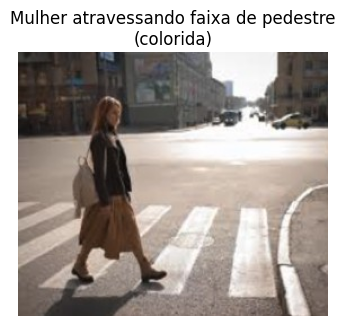

In [4]:
img_pil = Image.open('../images/mulher_faixa_pedestre.jpg')
fig = plt.figure(figsize=(4, 4))
plt.title("Mulher atravessando faixa de pedestre\n(colorida)")
plt.axis('off')
fig = plt.imshow(img_pil)
plt.show()

### Investigando a representação das imagens coloridas

In [14]:
# novamente, abrimos a imagem com PIL e exibimos suas dimensões (largura x altura)
img_pil = Image.open('../images/mulher_faixa_pedestre.jpg')
# img_pil = Image.open('../images/pipeline.png')
print(f"Dimensões da imagem: {img_pil.size} (largura x altura)")
print(40*'-')
print(f"Image.mode: {img_pil.mode}")       # RGB, L, RGBA...
print(f'Formato   : {img_pil.format}')     # JPEG, PNG...
print(f'Info extra: {img_pil.info}')       # metadados EXIF etc.

print(40*'-')
# convertemos para numpy
img_np = np.array(img_pil)
print(f"Dimensões da imagem: {img_np.shape} (altura, largura, canais)")
print('>>> Observe que nas dimensões, além da inversão de largura e altura, existe um item extra (canais).')

Dimensões da imagem: (275, 234) (largura x altura)
----------------------------------------
Image.mode: RGB
Formato   : JPEG
Info extra: {'jfif': 257, 'jfif_version': (1, 1), 'dpi': (120, 120), 'jfif_unit': 1, 'jfif_density': (120, 120), 'progressive': 1, 'progression': 1}
----------------------------------------
Dimensões da imagem: (234, 275, 3) (altura, largura, canais)
>>> Observe que nas dimensões, além da inversão de largura e altura, existe um item extra (canais).


In [3]:
img_pil = Image.open('../images/mulher_faixa_pedestre.jpg')
img_np = np.array(img_pil)

print('Representação da imagem em numpy')
print(f'Shape  : {img_np.shape}')          # (altura, largura, canais)
print(f'Dtype  : {img_np.dtype}')          # uint8 para imagens comuns
print(f'Min    : {img_np.min()}')          # valor mínimo de intensidade r, g ou b de pixels
print(f'Max    : {img_np.max()}')          # valor máximo de intensidade r, g ou b de pixels
print(f'Média  : {img_np.mean():.2f}')     # intensidade média
print(f'Total de pixels: {img_np.shape[0] * img_np.shape[1]:,}')

print('\nAcessando pixels individualmente:')
# img_np[linha, coluna, canal]
print(f'Pixel (0,0) — canto superior esquerdo : {img_np[0, 0]}')
print(f'Pixel central                          : {img_np[img_np.shape[0]//2, img_np.shape[1]//2]}')

print('\nCanais separados:')
R = img_np[:, :, 0]   # canal Vermelho
G = img_np[:, :, 1]   # canal Verde
B = img_np[:, :, 2]   # canal Azul
print(f'Canal R — shape: {R.shape}, média: {R.mean():.1f}')
print(f'Canal G — shape: {G.shape}, média: {G.mean():.1f}')
print(f'Canal B — shape: {B.shape}, média: {B.mean():.1f}')

print('\nPrimeiros 3 pixels da primeira linha (R, G, B):')
print(img_np[0, :3, :])

Representação da imagem em numpy
Shape  : (234, 275, 3)
Dtype  : uint8
Min    : 3
Max    : 255
Média  : 137.39
Total de pixels: 64,350

Acessando pixels individualmente:
Pixel (0,0) — canto superior esquerdo : [56 57 52]
Pixel central                          : [209 191 179]

Canais separados:
Canal R — shape: (234, 275), média: 146.5
Canal G — shape: (234, 275), média: 136.3
Canal B — shape: (234, 275), média: 129.3

Primeiros 3 pixels da primeira linha (R, G, B):
[[56 57 52]
 [56 57 52]
 [57 56 52]]


In [7]:
# exibindo a representacao de uma parte da imagem
img_pil = Image.open('../images/mulher_faixa_pedestre.jpg')
exibe_dimensao_e_conteudo(img_pil)


Dimensões da imagem: (234, 275, 3)
[[[56 57 52]
  [56 57 52]
  [57 56 52]
  [55 54 50]
  [47 46 42]
  [39 38 34]
  [34 33 29]
  [33 32 28]
  [33 29 26]
  [34 30 27]
  [37 33 30]
  [42 38 35]]

 [[58 59 54]
  [59 60 55]
  [60 59 55]
  [57 56 52]
  [49 48 44]
  [40 39 35]
  [33 32 28]
  [31 30 26]
  [32 28 25]
  [33 29 26]
  [37 33 30]
  [45 41 38]]

 [[60 61 56]
  [61 62 57]
  [62 63 58]
  [59 60 55]
  [52 51 47]
  [41 40 36]
  [33 32 28]
  [30 29 25]
  [30 29 25]
  [33 32 28]
  [39 38 34]
  [47 46 42]]

 [[60 61 56]
  [61 62 57]
  [63 64 59]
  [61 62 57]
  [54 53 49]
  [43 42 38]
  [35 34 30]
  [32 31 27]
  [35 34 30]
  [40 39 35]
  [46 45 41]
  [52 51 47]]

 [[60 61 56]
  [62 63 58]
  [64 65 60]
  [63 64 59]
  [56 57 52]
  [47 48 43]
  [41 40 36]
  [39 38 34]
  [44 43 39]
  [50 49 45]
  [55 54 50]
  [57 56 52]]

 [[60 61 56]
  [62 63 58]
  [64 65 60]
  [64 65 60]
  [59 60 55]
  [52 53 48]
  [49 48 44]
  [49 48 44]
  [53 52 48]
  [58 57 53]
  [61 60 56]
  [59 58 54]]

 [[61 60 56]
  [6

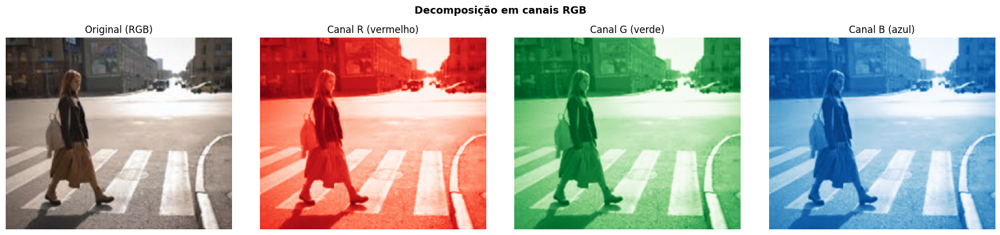

In [8]:
# visualização em separado dos canais R, G e B
img_pil = Image.open('../images/mulher_faixa_pedestre.jpg')
img_np = np.array(img_pil)
R = img_np[:, :, 0]   # canal Vermelho
G = img_np[:, :, 1]   # canal Verde
B = img_np[:, :, 2]   # canal Azul

fig, axes = plt.subplots(1, 4, figsize=(18, 4))
titulos = ['Original (RGB)', 'Canal R (vermelho)', 'Canal G (verde)', 'Canal B (azul)']
cmaps   = [None, 'Reds_r', 'Greens_r', 'Blues_r']
conteudos = [img_np, R, G, B]

for ax, conteudo, titulo, cmap in zip(axes, conteudos, titulos, cmaps):
    ax.imshow(conteudo, cmap=cmap)
    ax.set_title(titulo)
    ax.axis('off')

plt.suptitle('Decomposição em canais RGB', fontsize=13, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

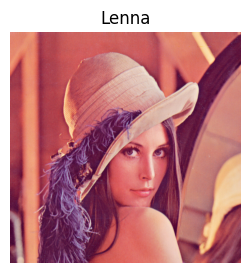

In [9]:
img_pil = Image.open('../images/lenna.png')
img_np = np.array(img_pil)
fig = plt.figure(figsize=(3, 3))
plt.title('Lenna')
plt.axis('off')
fig = plt.imshow(img_np)


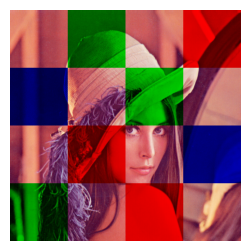

In [10]:
# img_pil = Image.open('../images/mulher_faixa_pedestre.jpg')
img_pil = Image.open('../images/lenna.png')
img_np = np.array(img_pil)
alt, larg = img_np.shape[0:2]
step_y = int(alt/4)
step_x = int(larg/4)
for y in range(0,4):
    for x in range(0,4):
        end_y = (y+1)*step_y
        if y==3: end_y = alt
        end_x = (x+1)*step_x
        if x==3: end_x = larg
        crop = img_np[y*step_y:end_y, x*step_x:end_x]
        if (y + x)%2==1:
            canal = int(5.5*y + 4.2*x)%3
            for idx in range(0, 3):
                if idx != canal:
                    crop[:, :, idx] = 0
            # crop = crop.mean(axis=2, keepdims=True).astype(np.uint8) # cinza
        # else:
        #     crop = np.clip(crop*0.7, 0, 255).astype(np.uint8) # escurece

        img_np[y*step_y:end_y, x*step_x:end_x] = crop

fig = plt.figure(figsize=(3, 3))
plt.axis('off')
fig = plt.imshow(img_np)       



In [ ]:
# alterando valor de pixels
img_pil = Image.open('../images/vc.jpg')
img_np = np.array(img_pil)
img_np[0:10, 0:6, :] = np.array([255, 0, 0])
img_np[0:10, 6:12]   = np.array([0, 255, 0])
img_np[0:10, 12:18]  = np.array([0, 0, 255])
fig = plt.figure(figsize=(4, 4))
plt.axis('off')
fig = plt.imshow(img_np)


ValueError: could not broadcast input array from shape (3,) into shape (10,6,4)

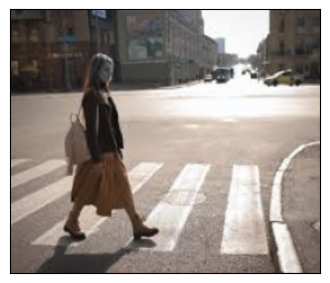

In [14]:
img_pil = Image.open('../images/mulher_faixa_pedestre.jpg')
img_np = np.array(img_pil)
rosto = img_np[40:65, 70:95]
alt, larg = rosto.shape[0:2]
for y in range(alt):
    for x in range(larg):
        pixel = rosto[y, x]
        pixel = pixel.mean()
        rosto[y, x] = pixel

img_np[40:65, 70:95] = rosto
fig = plt.figure(figsize=(4, 4))
plt.xticks([])
plt.yticks([])
fig = plt.imshow(img_np)

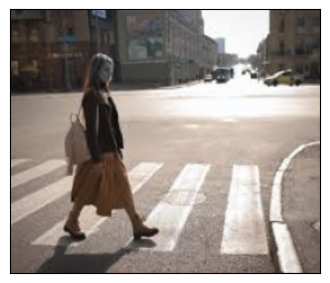

In [15]:
img_pil = Image.open('../images/mulher_faixa_pedestre.jpg')
img_np = np.array(img_pil)
rosto = img_np[40:65, 70:95]
# versão vetorizada
rosto[:] = rosto.mean(axis=2, keepdims=True).astype(np.uint8)
# podia ser apenas: 
# rosto = rosto.mean(axis=2, keepdims=True).astype(np.uint8)

img_np[40:65, 70:95] = rosto
fig = plt.figure(figsize=(4, 4))
plt.xticks([])
plt.yticks([])
fig = plt.imshow(img_np)



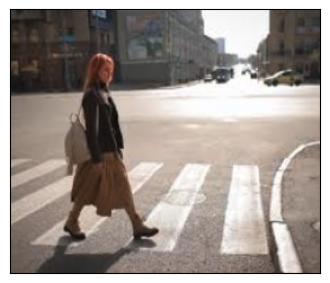

In [16]:
img_pil = Image.open('../images/mulher_faixa_pedestre.jpg')
img_np = np.array(img_pil)
rosto = img_np[40:65, 70:95]
alt, larg = rosto.shape[0:2]
for y in range(alt):
    for x in range(larg):
        pixel = rosto[y, x]
        pixel[0] = int(min(pixel[0]*1.25, 255))
        rosto[y, x] = pixel

img_np[40:65, 70:95] = rosto
fig = plt.figure(figsize=(4, 4))
plt.xticks([])
plt.yticks([])
fig = plt.imshow(img_np)

In [17]:
def show_image(img, size=None, cmap=None, axis='off', titulos=None):
    img_list = [img] if not isinstance(img, list) else img
    if titulos and not isinstance(titulos, list): titulos = [titulos]
    num_images = len(img_list)
    fig, axes = plt.subplots(1, num_images, figsize=size)
    if num_images == 1: axes = [axes]
    for i, image in enumerate(img_list):
        axes[i].imshow(image, cmap=cmap)
        axes[i].axis(axis)
        if titulos and i < len(titulos): axes[i].set_title(titulos[i])
            
    plt.tight_layout()
    plt.show()

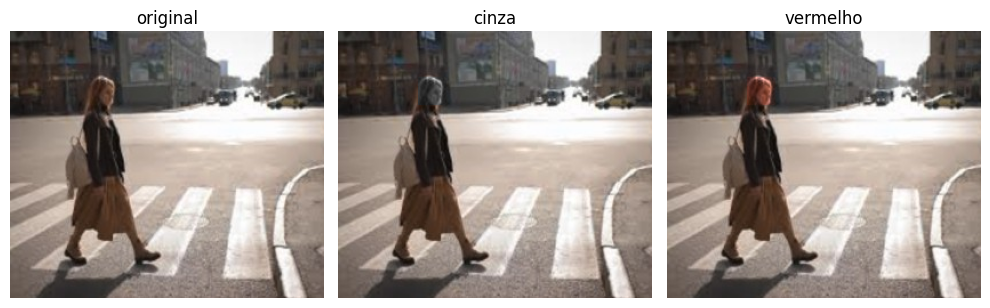

In [18]:
img_pil = Image.open('../images/mulher_faixa_pedestre.jpg')
img_np = np.array(img_pil)
img_np_bw = np.copy(img_np) # preto e branco
img_np_r = np.copy(img_np)  # vermelho

rosto_bw = img_np_bw[40:65, 70:95]
rosto_r = img_np_r[40:65, 70:95]

rosto_bw = rosto_bw.mean(axis=2, keepdims=True).astype(np.uint8)
rosto_r[:, :, 0] = np.clip(rosto_r[:, :, 0] * 1.3, 0, 255).astype(np.uint8)

img_np_bw[40:65, 70:95] = rosto_bw
img_np_r[40:65, 70:95] = rosto_r

show_image([img_np, img_np_bw, img_np_r], size=(10, 8), axis='off', titulos=['original', 'cinza', 'vermelho'])


### Imagens RGBA (png com transparência)
<img src='../images/hal9000.png' width=80>

Imagens RGBA tem 4 canais: R (red) G (green) B (blue) A (aplha)

O canal alpha indica o nivel de transparência ou opacidade da imagem.

In [19]:
img_pil = Image.open('../images/hal9000.png')
print(f"Dimensões da imagem: {img_pil.size} (largura x altura)")
print(40*'-')
print(f"Image.mode: {img_pil.mode}")

print(40*'-')
# convertemos para numpy
img_np = np.array(img_pil)
print(f"Dimensões da imagem: {img_np.shape} (altura, largura, canais)")
print('>>> Observe que a imagem possui 4 canais.')

Dimensões da imagem: (431, 432) (largura x altura)
----------------------------------------
Image.mode: RGBA
----------------------------------------
Dimensões da imagem: (432, 431, 4) (altura, largura, canais)
>>> Observe que a imagem possui 4 canais.


In [20]:
# Na prática... convertemos para RGB.
# O mesmo se faz nas imagens Preto e Branco
img_pil = Image.open('../images/hal9000.png')
print(f"Image.mode: {img_pil.mode}")
img_np = np.array(img_pil)
print(f"Dimensões da imagem: {img_np.shape} (altura, largura, canais)")
print(40*'-')
print('Conversão para RGB')
img_pil = img_pil.convert('RGB')
print(f"Image.mode: {img_pil.mode}")
img_np = np.array(img_pil)
print(f"Dimensões da imagem: {img_np.shape} (altura, largura, canais)")



Image.mode: RGBA
Dimensões da imagem: (432, 431, 4) (altura, largura, canais)
----------------------------------------
Conversão para RGB
Image.mode: RGB
Dimensões da imagem: (432, 431, 3) (altura, largura, canais)


Conversão para preto e branco

Dimensões antes:  (512, 512, 3) (colorido)
Dimensões depois: (512, 512)    (preto e branco)


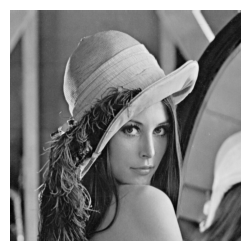

In [21]:

img_pil = Image.open('../images/lenna.png')
img_np = np.array(img_pil)
print(f"Dimensões antes:  {img_np.shape} (colorido)")
img_pil = img_pil.convert('L')
img_np = np.array(img_pil)
print(f"Dimensões depois: {img_np.shape}    (preto e branco)")
fig = plt.figure(figsize=(3, 3))
plt.axis('off')
fig = plt.imshow(img_np, cmap='gray')    

### Redimensionamento de imagens

Em muitas situações precisamos redimensionar as imagens.

A maioria dos métodos de deel learning espera as imagens em tamanho pre-determinado.

As bibliotecas possuem funções para realizar essas conversões de forma muito facilitada. 

Mas é importante entender o que está acontecendo e entender as consequências da escolha de modelos (a maioria deles atrelado a tamanhos de entrada de imagens).


(613, 403)


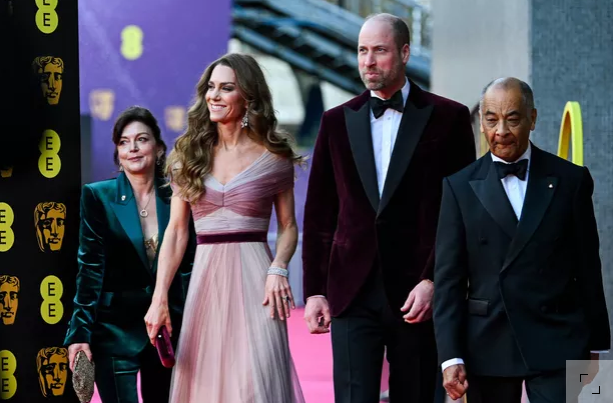

(224, 224)


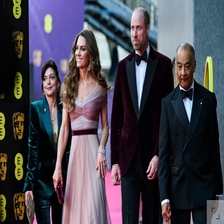

In [22]:
img_pil = Image.open('../images/revista.png')
print(img_pil.size) # > (613, 403)
display(img_pil)
resample=Image.LANCZOS
img_224x224 = img_pil.resize((224, 224), resample=resample)
print(img_224x224.size) # > (224, 224)
display(img_224x224)

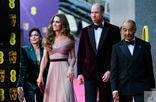

In [23]:
# Redimensionando de forma proporcional
img_pil = Image.open('../images/revista.png')
largura, altura = img_pil.size
nova_largura = 156
nova_altura = int(nova_largura * (altura / largura))
resample=Image.LANCZOS
img_largura_nova = img_pil.resize((nova_largura, nova_altura), resample=resample)
display(img_largura_nova)


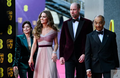

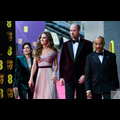

In [24]:
# Redimensionando de forma proporcional centralizada num quadrado de fundo preto
img_pil = Image.open('../images/revista.png')
largura, altura = img_pil.size
max_dimensao = 120
nova_largura = nova_altura = max_dimensao
if largura > altura: nova_altura = int(nova_largura * (altura / largura))
elif altura > largura: nova_largura = int(nova_altura * (largura / altura))
resample=Image.LANCZOS
img_redim = img_pil.resize((nova_largura, nova_altura), resample=resample)
img_redim_quadrada = ImageOps.pad(img_redim, (max_dimensao, max_dimensao), 
                                  color=(0, 0, 0))
display(img_redim)
display(img_redim_quadrada)



In [25]:
def resize_image_pil(
        img_pil, max_dimensao=None, dimensao_exata=None, 
        resample=Image.LANCZOS, pad=False, pad_color=(0, 0, 0)
):
    if max_dimensao is None and dimensao_exata is None: return img_pil
    if dimensao_exata is not None:
        max_dimensao = max(dimensao_exata)
        nova_largura, nova_altura = dimensao_exata
    else:
        largura, altura = img_pil.size
        nova_largura = nova_altura = max_dimensao
        if largura > altura: nova_altura = int(nova_largura * (altura / largura))
        elif altura > largura: nova_largura = int(nova_altura * (largura / altura))
    
    img_redim = img_pil.resize((nova_largura, nova_altura), resample=resample)
    if pad: img_redim = ImageOps.pad(img_redim, (max_dimensao, max_dimensao), color=pad_color)
    return img_redim


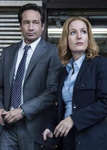

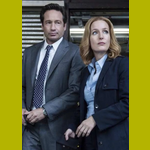

In [26]:
img_pil = Image.open('../images/arquivo_x.png')
img_redim = resize_image_pil(img_pil, max_dimensao=150)
display(img_redim)
img_redim = resize_image_pil(img_pil, max_dimensao=150, pad=True, pad_color=(180, 180, 0))
display(img_redim)



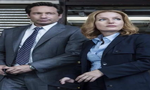

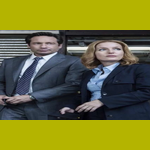

In [27]:
img_pil = Image.open('../images/arquivo_x.png')
img_redim = resize_image_pil(img_pil, dimensao_exata=(150, 90))
display(img_redim)
img_redim = resize_image_pil(img_pil, dimensao_exata=(150, 90), pad=True, pad_color=(180, 180, 0))
display(img_redim)


### Abrindo a imagem com OpenCV (pacote cv2)

In [28]:

img_bgr = cv2.imread('../images/lenna.png')   # BGR por padrão
print("O OpenCV já abre a imagem como numpy.ndarray")
print(f"type(img_bgr): {type(img_bgr)}")
print(img_bgr.shape)

O OpenCV já abre a imagem como numpy.ndarray
type(img_bgr): <class 'numpy.ndarray'>
(512, 512, 3)


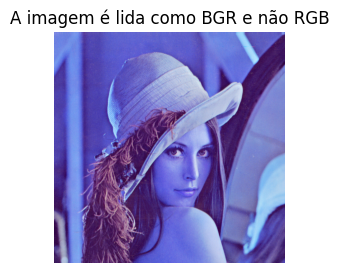

In [29]:
img_bgr = cv2.imread('../images/lenna.png')   # BGR por padrão
fig = plt.figure(figsize=(3, 3))
plt.title("A imagem é lida como BGR e não RGB")
plt.axis('off')
fig = plt.imshow(img_bgr)


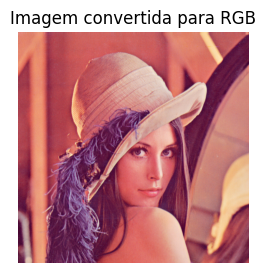

In [30]:
img_bgr = cv2.imread('../images/lenna.png')   # BGR por padrão
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
fig = plt.figure(figsize=(3, 3))
plt.title("Imagem convertida para RGB")
plt.axis('off')
fig = plt.imshow(img_rgb)


In [31]:
# função equivalente para redimensionar
def resize_image_cv2(
        img_np_rgb, max_dimensao=None, dimensao_exata=None, 
        inter=cv2.INTER_AREA, pad=False, pad_color=(0, 0, 0)
):
    if max_dimensao is None and dimensao_exata is None: return img_np_rgb
    if dimensao_exata is not None:
        max_dimensao = max(dimensao_exata)
        nova_altura, nova_largura = dimensao_exata
    else:
        altura, largura = img_np_rgb.shape[0:2]
        nova_largura = nova_altura = max_dimensao
        if largura > altura: nova_altura = int(nova_largura * (altura / largura))
        elif altura > largura: nova_largura = int(nova_altura * (largura / altura))
    
    # o metodo resize requer (largura, altura) - diferente da ordem do shape
    img_redim = cv2.resize(img_np_rgb, (nova_largura, nova_altura), interpolation=inter)
    if pad:
        vert_border = (max_dimensao - nova_altura) // 2
        horiz_border = (max_dimensao - nova_largura) // 2
        img_redim = cv2.copyMakeBorder(img_redim, vert_border, vert_border, horiz_border, horiz_border, 
                                        cv2.BORDER_CONSTANT, value=pad_color)
    return img_redim


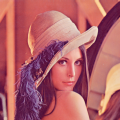

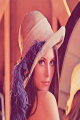

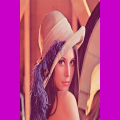

In [32]:
img_bgr = cv2.imread('../images/lenna.png')   # BGR por padrão
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_redim = resize_image_cv2(img_rgb, max_dimensao=120)
display(Image.fromarray(img_redim))
img_redim = resize_image_cv2(img_rgb, dimensao_exata=(120, 80))
display(Image.fromarray(img_redim))
img_redim = resize_image_cv2(img_rgb, dimensao_exata=(120, 80), pad=True, pad_color=(200, 0, 200))
display(Image.fromarray(img_redim))


## 3. NumPy para manipulação de imagens

Nos exemplos da seção 2 vimos diversas operações com numpy:

- np.array()

Cria um objeto ndarray do numpy com base no objeto e parâmetros passados.
````
vet = np.array([1, 2, 3], nd)
````


- np.mean()
- np.clip()
- np.astype()



In [33]:
# Criando vetor a partir de uma lista de inteiros
vetor = np.array([10, 20, 30, 40])
# exibindo algumas propriedades
print(vetor)
print(f"Tipo do objeto: {type(vetor)}")
print(f"Formato (shape): {vetor.shape}")
print(f"Tipo interno (dtype): {vetor.dtype})")


[10 20 30 40]
Tipo do objeto: <class 'numpy.ndarray'>
Formato (shape): (4,)
Tipo interno (dtype): int64)


In [34]:
# Criando matriz a partir de uma lista de inteiros
matriz = np.array([
    [1, 2, 3], 
    [4, 5, 6]
])

print(matriz)
print(f"Dimensão: {matriz.shape}")
print(f"Número de dimensões: {matriz.ndim}")
print(f"Total de elementos: {matriz.size}")

[[1 2 3]
 [4 5 6]]
Dimensão: (2, 3)
Número de dimensões: 2
Total de elementos: 6


In [35]:
# especificando o tipo de dado
array_float = np.array([
    [1, 2, 3], 
    [4, 5, 6]
], dtype='float32')

print(array_float) 
print(f"Tipo dos dados: {array_float.dtype}")


[[1. 2. 3.]
 [4. 5. 6.]]
Tipo dos dados: float32


In [36]:
# criando placeholders (funcoes uteis)
zeros = np.zeros((3, 3)) # Requer uma tupla com as dimensões

# Array de um intervalo (similar ao range() do Python)
sequencia = np.arange(0, 10, 2) # (início, fim exclusivo, passo)

# Array com valores linearmente espaçados
espacado = np.linspace(0, 1, 5) # (início, fim, quantidade de números)

print('zeros')
print(zeros)
print('\nsequencia')
print(sequencia)
print('\nespaçado')
print(espacado)


zeros
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]

sequencia
[0 2 4 6 8]

espaçado
[0.   0.25 0.5  0.75 1.  ]


### Observações importantes

- Homogeneidade: Diferente das listas do Python, um array NumPy deve conter apenas um tipo de dado. Se você misturar int e string, o NumPy converterá tudo para string (o tipo mais genérico).

- Performance: Arrays NumPy são fixos em tamanho no momento da criação. Para "adicionar" elementos, o NumPy na verdade cria um novo array, o que pode ser lento se feito repetidamente.

- A Tupla de Formato: Sempre que uma função pedir o formato (como em np.zeros), lembre-se de passar os valores entre parênteses extras: (linhas, colunas)

### Broadcasting (propagação)

Algumas operações podem ser realizadas entre objetos de dimensões diferentes.

Nesses casos, o numpy automaticamente tenta fazer broadcasting da operação.

Para que o broadcasting aconteça, o numpy compara os shapes dos dois arrays da direita para a esquerda. Duas dimensões são compatíveis quando:

- Uma delas é 1.
- Elas são iguais.



In [37]:
# Broadcasting (propagação)

# somando um escalar em todos elementos do vetor (ou matriz)
vetor = np.array([1, 2, 3])
resultado_escalar = vetor + 10

print("Escalar + Vetor:")
print(f"{vetor} + 10 = {resultado_escalar}")

# Somando um Vetor a uma Matriz
# ex. abaixo soma o vetor [10, 20, 30] em cada linha da matriz
matriz = np.array([
    [1, 2, 3],
    [4, 5, 6]
])
print('\nshape da matriz:', matriz.shape) # (2, 3)
vetor_linha = np.array([10, 20, 30])
print('shape do vetor_linha:', vetor_linha.shape) # (3,)

resultado_matriz = matriz + vetor_linha

print('\nmatriz:')
print(matriz)
print('vetor_linha:', vetor_linha)
print('\nresultado da soma:')
print(resultado_matriz)


Escalar + Vetor:
[1 2 3] + 10 = [11 12 13]

shape da matriz: (2, 3)
shape do vetor_linha: (3,)

matriz:
[[1 2 3]
 [4 5 6]]
vetor_linha: [10 20 30]

resultado da soma:
[[11 22 33]
 [14 25 36]]


### Outros conceitos úteis

In [38]:
# Transposicao
A = np.array([[1, 2, 3], 
              [4, 5, 6]])

print("Matriz A:")
print(A)

# Transposta: vira 3x2
A_t = A.T 

print("\nMatriz Original (2,3):\n", A.shape)
print("Matriz Transposta (3,2):\n", A_t.shape)

# pode ser feito de outra forma
A_t2 = A.transpose(1, 0)
print("Matriz Transposta (3,2):\n", A_t2.shape)

print("\nMatriz transposta:")
print(A_t2)

Matriz A:
[[1 2 3]
 [4 5 6]]

Matriz Original (2,3):
 (2, 3)
Matriz Transposta (3,2):
 (3, 2)
Matriz Transposta (3,2):
 (3, 2)

Matriz transposta:
[[1 4]
 [2 5]
 [3 6]]


Shape original: (407, 1082, 4)
Shape depois do transpose: (1082, 407, 4)


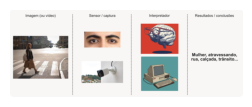

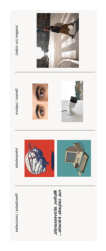

In [39]:
# transposicao das dimensoes de uma imagem
img_pil = Image.open('../images/pipeline.png')
img_np = np.array(img_pil)
fig = plt.figure(figsize=(3, 3))
plt.axis('off')
fig = plt.imshow(img_np)
print('Shape original:', img_np.shape)
img_np_t = img_np.transpose(1, 0, 2)
fig = plt.figure(figsize=(3, 3))
plt.axis('off')
fig = plt.imshow(img_np_t)
print('Shape depois do transpose:', img_np_t.shape)


In [40]:
# produto escalar / multiplicação de matrizes (np.dot ou operador @)

# produto escalar = |v1|.|v2|.cos(ø)
v1 = np.array([3, 2])
v2 = np.array([4, 0])
prod_vet = v1 @ v2 # ou v1.dot(v2)
print(f"Produto escalar {v1}@{v2} = {prod_vet}\n")

# Matriz (2, 3)
ma1 = np.array([[1, 2, 3], [4, 5, 6]])
# Matriz (3, 2)
ma2 = np.array([[7, 8], [9, 10], [11, 12]])
# Multiplicação de matrizes
resultado_dot = np.dot(ma1, ma2) 
# Forma moderna e preferida
resultado_at = ma1 @ ma2 

print("Resultado da Multiplicação (2,2):\n", resultado_at)

Produto escalar [3 2]@[4 0] = 12

Resultado da Multiplicação (2,2):
 [[ 58  64]
 [139 154]]


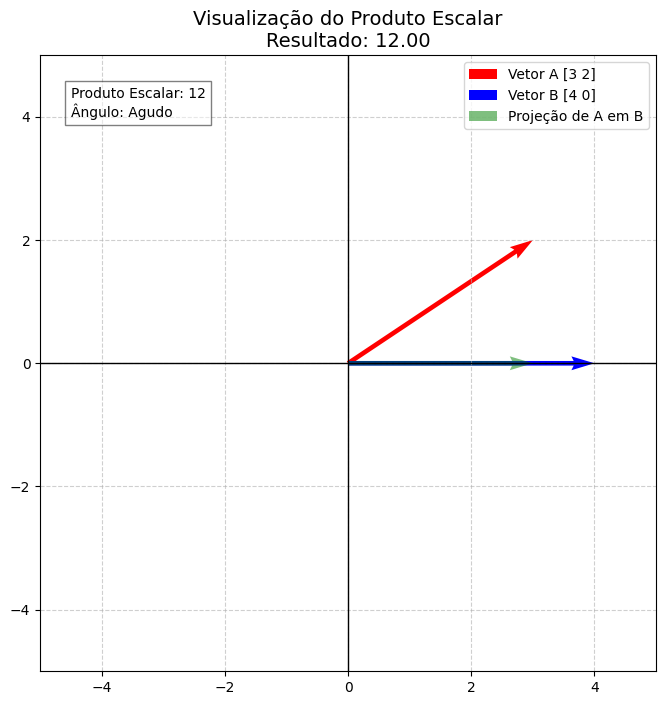

In [41]:
def produto_escalar(v1, v2):
    dot_product = np.dot(v1, v2)
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.axhline(0, color='black', linewidth=1)
    ax.axvline(0, color='black', linewidth=1)
    origin = [0], [0]
    ax.quiver(*origin, v1[0], v1[1], color='r', angles='xy', scale_units='xy', scale=1, label=f'Vetor A {v1}')
    ax.quiver(*origin, v2[0], v2[1], color='b', angles='xy', scale_units='xy', scale=1, label=f'Vetor B {v2}')
    # Cálculo da projeção de V1 sobre V2 para ilustrar a geometria
    v2_norm = np.linalg.norm(v2)
    proj_v1_v2 = (dot_product / v2_norm**2) * v2
    ax.quiver(*origin, proj_v1_v2[0], proj_v1_v2[1], color='g', alpha=0.5, 
              angles='xy', scale_units='xy', scale=1, label='Projeção de A em B')

    limit = max(np.abs([*v1, *v2])) + 1
    ax.set_xlim(-limit, limit)
    ax.set_ylim(-limit, limit)
    ax.set_aspect('equal')
    
    plt.title(f'Visualização do Produto Escalar\nResultado: {dot_product:.2f}', fontsize=14)
    plt.legend()
    
    info_text = (f"Produto Escalar: {dot_product}\n"
                 f"Ângulo: {'Agudo' if dot_product > 0 else 'Obtuso' if dot_product < 0 else 'Reto'}")
    plt.text(-limit+0.5, limit-1, info_text, bbox=dict(facecolor='white', alpha=0.5))
    plt.show()

vetor_a = np.array([3, 2])
vetor_b = np.array([4, 0])
produto_escalar(vetor_a, vetor_b)

In [42]:
# calculo de similaridade de cosseno
# muito útil para comparar a similaridade de dois vetores
# formula: cos(ø) = (a @ b) / (|a|*|b|)
def sim_cosseno(A, B):
    dot_product = np.dot(A, B)
    norm_A = np.linalg.norm(A)
    norm_B = np.linalg.norm(B)
    if norm_A == 0 or norm_B == 0:
        return 0
    return dot_product / (norm_A * norm_B)

print('(10, 7) * (10, 7):', sim_cosseno( np.array([10, 7]), np.array([10, 7])) )
print('(10, 7) * (1, 0.7):', sim_cosseno( np.array([10, 7]), np.array([1, 0.7])) )
print('(10, 7) * (10, 10):', sim_cosseno( np.array([10, 7]), np.array([10, 10])) )
print('(10, 7) * (10, 100):', sim_cosseno( np.array([10, 7]), np.array([10, 100])) )
print('ortogonal')
print('(10, 7) * (-7, 10):', sim_cosseno( np.array([10, 7]), np.array([-7, 10])) )



(10, 7) * (10, 7): 1.0000000000000002
(10, 7) * (1, 0.7): 1.0
(10, 7) * (10, 10): 0.9847835588179368
(10, 7) * (10, 100): 0.6521329826588793
ortogonal
(10, 7) * (-7, 10): 0.0


Par 1: Similiaridade = 1.0000
Par 2: Similiaridade = 0.9984
Par 3: Similiaridade = 0.9191
Par 4: Similiaridade = 0.8070
Par 5: Similiaridade = 0.6999
Par 6: Similiaridade = -0.1821
Par 7: Similiaridade = 0.7241


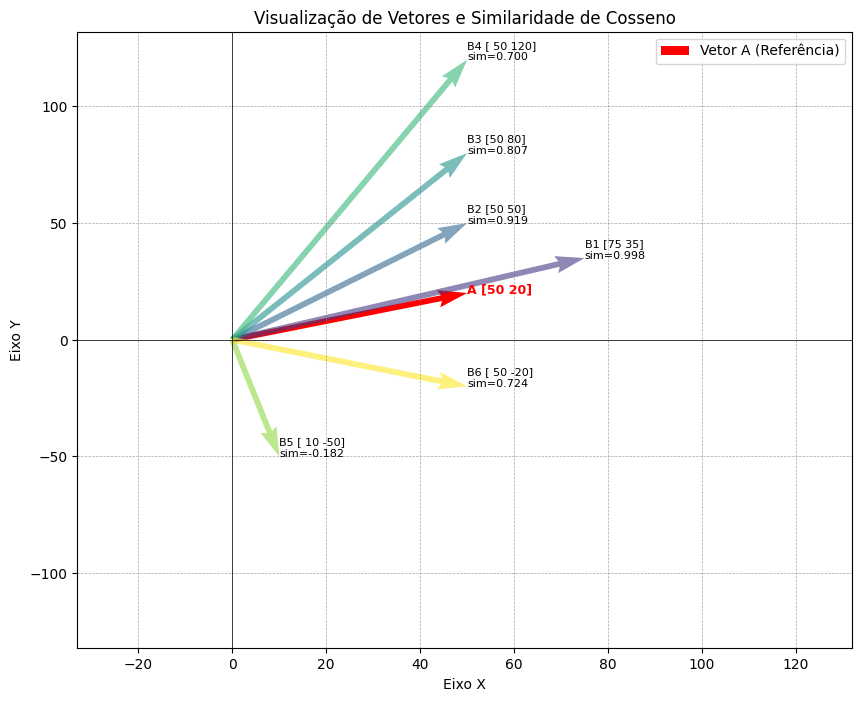

In [43]:
def sim_cosseno(A, B):
    dot_product = np.dot(A, B)
    norm_A = np.linalg.norm(A)
    norm_B = np.linalg.norm(B)
    if norm_A == 0 or norm_B == 0:
        return 0
    return dot_product / (norm_A * norm_B)

vetores_teste = [
    (np.array([50, 20]), np.array([50, 20])),
    (np.array([50, 20]), np.array([75, 35])),
    (np.array([50, 20]), np.array([50, 50])),
    (np.array([50, 20]), np.array([50, 80])),
    (np.array([50, 20]), np.array([50, 120])),
    (np.array([50, 20]), np.array([10, -50])),
    (np.array([50, 20]), np.array([50, -20])),

]

plt.figure(figsize=(10, 8))
plt.axhline(0, color='black', linewidth=0.5)
plt.axvline(0, color='black', linewidth=0.5)
plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7)
cores = plt.cm.viridis(np.linspace(0, 1, len(vetores_teste)))
for i, (A, B) in enumerate(vetores_teste):
    sim = sim_cosseno(A, B)
    print(f"Par {i+1}: Similiaridade = {sim:.4f}")
    if i == 0:
        plt.quiver(0, 0, A[0], A[1], angles='xy', scale_units='xy', scale=1, color='red', label='Vetor A (Referência)')
        plt.text(A[0], A[1], f'A {A}', fontsize=9, color='red', fontweight='bold')
    else:
        plt.quiver(0, 0, B[0], B[1], angles='xy', scale_units='xy', scale=1, color=cores[i], alpha=0.6)
        plt.text(B[0], B[1], f'B{i} {B}\nsim={sim:.3f}', fontsize=8)

plt.title("Visualização de Vetores e Similaridade de Cosseno")
plt.xlabel("Eixo X")
plt.ylabel("Eixo Y")

all_vectors = np.array([v for dupla in vetores_teste for v in dupla])
limit = np.max(np.abs(all_vectors)) * 1.1
plt.xlim(-limit/4, limit)
plt.ylim(-limit, limit)

plt.legend()
plt.show()

In [44]:
# Redimensionando vetores / matrizes 
# função reshape
dados = np.arange(12)
print('shape original:', dados.shape)

# Remodelar para 3 linhas e 4 colunas
matriz_3x4 = dados.reshape(3, 4)
print('shape matriz_3x4:', matriz_3x4.shape)

# Dica : use -1 para o NumPy calcular uma das dimensões automaticamente
matriz_auto = dados.reshape(2, -1) # Ele entende que o -1 deve ser 6
print('shape matriz_auto:', matriz_auto.shape)

print("\nOriginal:", dados)
print("\nReshaped (3,4):\n", matriz_3x4)
print("\nAutomatico (2, -1):\n", matriz_auto)

shape original: (12,)
shape matriz_3x4: (3, 4)
shape matriz_auto: (2, 6)

Original: [ 0  1  2  3  4  5  6  7  8  9 10 11]

Reshaped (3,4):
 [[ 0  1  2  3]
 [ 4  5  6  7]
 [ 8  9 10 11]]

Automatico (2, -1):
 [[ 0  1  2  3  4  5]
 [ 6  7  8  9 10 11]]


In [45]:
# Flatten e Ravel (Aplainamento)
dados = np.arange(12)
matriz_3x4 = dados.reshape(3, 4)
vetor_linear = matriz_3x4.flatten()
print("Vetor flattened:", vetor_linear)


Vetor flattened: [ 0  1  2  3  4  5  6  7  8  9 10 11]


In [46]:
# Argmax (obtendo indice do maior valor)

# voce treinou uma rede neural para analisar imagens e retornar as probabilidades das seguintes classes
classes = ['pessoa', 'carro', 'arma', 'moto']

# imagine que probs tem o resultado da inferência de uma imagem
probs = np.array([0.05, 0.12, 0.75, 0.08])
classe_predita = np.argmax(probs)
print(f"A maior probabilidade está no índice: {classe_predita}")
print(f"Logo, o objeto encontrado é da classe {classes[classe_predita]}") 

print(40*'-')
# agora imagine q vc fez uma predicao em lote (batch) de 8 imagens e o resultado está em batch_probs
batch_probs = np.array([
    [0.15, 0.25, 0.20, 0.40],
    [0.07, 0.53, 0.25, 0.15],
    [0.02, 0.15, 0.70, 0.13],
    [0.15, 0.10, 0.60, 0.15],
    [0.99, 0.01, 0.00, 0.00],
    [0.33, 0.43, 0.20, 0.04],
    [0.11, 0.00, 0.00, 0.89],
    [0.45, 0.20, 0.01, 0.34],
])
idx_predicoes = np.argmax(batch_probs, axis=1)
print(f"Índices das classes preditas no batch: {idx_predicoes}")
labels_preds = [classes[idx] for idx in idx_predicoes]
print(f"Labels preditos: {labels_preds}")



A maior probabilidade está no índice: 2
Logo, o objeto encontrado é da classe arma
----------------------------------------
Índices das classes preditas no batch: [3 1 2 2 0 1 3 0]
Labels preditos: ['moto', 'carro', 'arma', 'arma', 'pessoa', 'carro', 'moto', 'pessoa']


## 4. Histograma, Contraste e Realce

### O que é um histograma de imagem?

O **histograma** de uma imagem mostra a **distribuição de intensidades dos pixels**. O eixo X representa os valores de intensidade (0–255), e o eixo Y representa quantos pixels têm aquela intensidade.

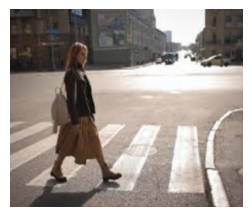

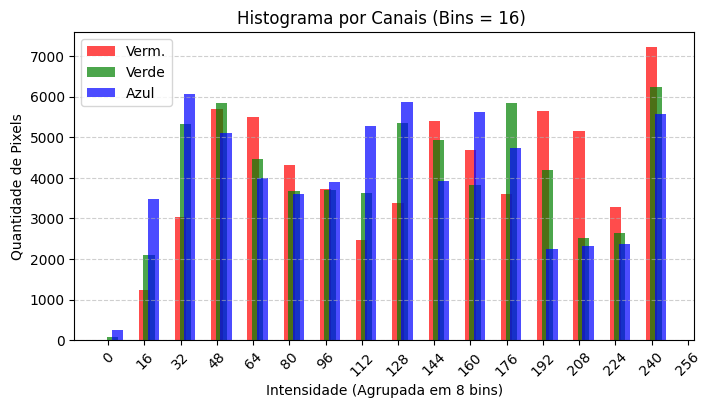

In [47]:
img_pil = Image.open('../images/mulher_faixa_pedestre.jpg')
img_np = np.array(img_pil)

def plot_histograma(img, num_bins=16, titulo_extra=''):
    plt.figure(figsize=(3, 3))
    plt.axis('off')
    plt.imshow(img)
    plt.show()
    num_bins = 16
    canais = ('Verm.', 'Verde', 'Azul')
    cores = ('r', 'g', 'b')
    plt.figure(figsize=(8, 4))
    plt.title(f"Histograma por Canais (Bins = {num_bins}) {titulo_extra}")
    plt.xlabel("Intensidade (Agrupada em 8 bins)")
    plt.ylabel("Quantidade de Pixels")
    for i, col in enumerate(cores):
        hist, bin_edges = np.histogram(img[:, :, i], bins=num_bins, range=(0, 256))
        plt.bar(bin_edges[:-1] + i*2, hist, width=5, color=col, label=canais[i], alpha=0.7)

    plt.legend()
    plt.xticks(bin_edges, rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.show()

plot_histograma(img_np)

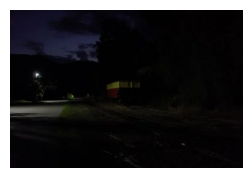

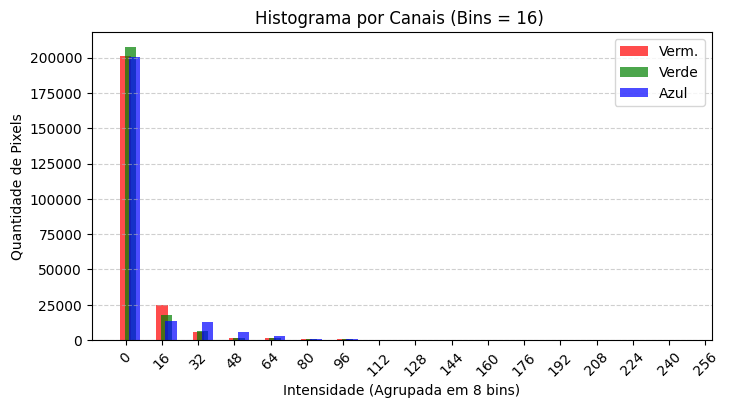

In [48]:
img_pil = Image.open('../images/imagem_histograma.png')
img_np = np.array(img_pil)
plot_histograma(img_np)


### Equalização

A ideia é redistribuir as intensidades para cobrir melhor o espectro [0, 255]
Vamos falar de 2 tipos:
- Equalização global — redistribui intensidades de forma global
- CLAHE — equalização adaptativa local com limite de contraste
  - clipLimit: quanto amplificar no máximo (evita ruído)
  - tileGridSize: tamanho dos blocos locais

Primeiro faremos em imagens preto e branco e depois em imagens coloridas.

💡 CLAHE preserva detalhes locais e evita o efeito de "supercontraste" da equalização global.

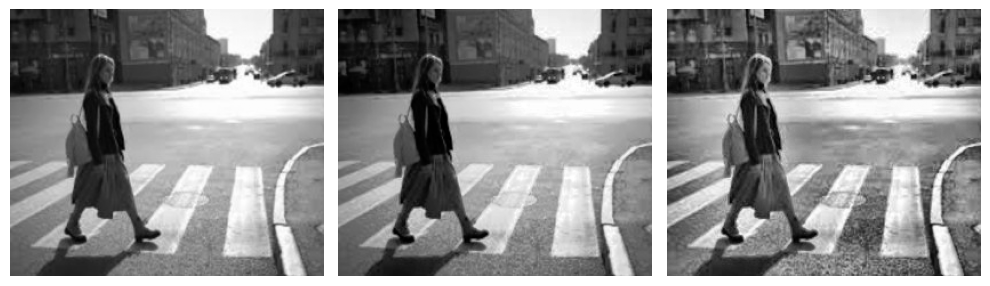

In [49]:
# equalização
img_gray = cv2.cvtColor(cv2.imread('../images/mulher_faixa_pedestre.jpg'), cv2.COLOR_BGR2GRAY)
img_eq = cv2.equalizeHist(img_gray)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
img_clahe = clahe.apply(img_gray)

show_image([img_gray, img_eq, img_clahe], size=(10, 3), cmap='gray', axis='off')

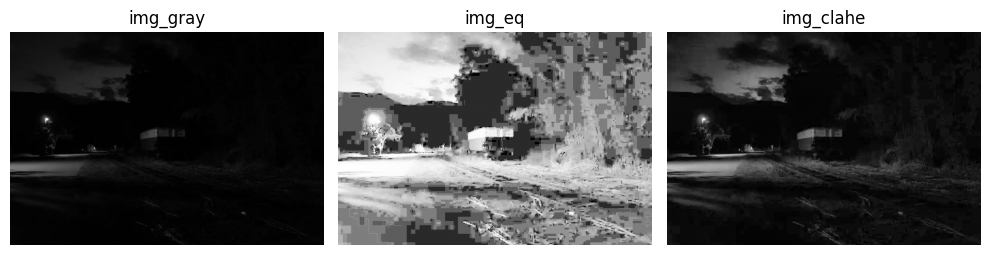

In [50]:
img_gray = cv2.cvtColor(cv2.imread('../images/imagem_histograma.png'), cv2.COLOR_BGR2GRAY)
img_eq = cv2.equalizeHist(img_gray)
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
img_clahe = clahe.apply(img_gray)
show_image([img_gray, img_eq, img_clahe], size=(10, 3), cmap='gray', axis='off',
            titulos=['img_gray', 'img_eq', 'img_clahe'])

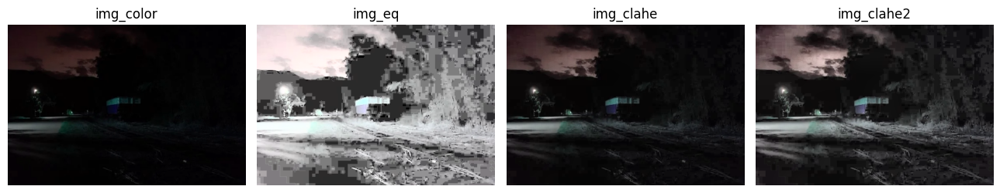

In [51]:
# E com a imagem colorida?

# operamos num espaço de cor diferente (YUV)

img_yuv = cv2.cvtColor(cv2.imread('../images/imagem_histograma.png'), cv2.COLOR_BGR2YUV)
img_color = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)

# Equalizar o canal Y (índice 0)
img_yuv[:, :, 0] = cv2.equalizeHist(img_yuv[:, :, 0])
img_eq = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)

img_yuv = cv2.cvtColor(cv2.imread('../images/imagem_histograma.png'), cv2.COLOR_BGR2YUV)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
img_yuv[:, :, 0] = clahe.apply(img_yuv[:, :, 0])
img_clahe = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)

img_yuv = cv2.cvtColor(cv2.imread('../images/imagem_histograma.png'), cv2.COLOR_BGR2YUV)
clahe = cv2.createCLAHE(clipLimit=8.0, tileGridSize=(8, 8))
img_yuv[:, :, 0] = clahe.apply(img_yuv[:, :, 0])
img_clahe2 = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)

show_image([img_color, img_eq, img_clahe, img_clahe2], size=(13, 3), axis='off',
           titulos=['img_color', 'img_eq', 'img_clahe', 'img_clahe2'] )

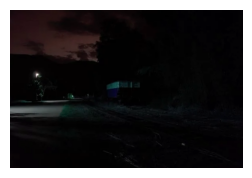

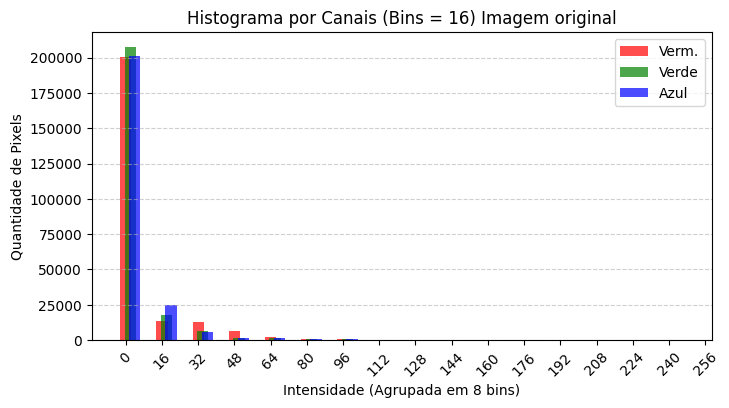

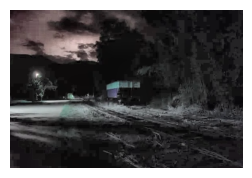

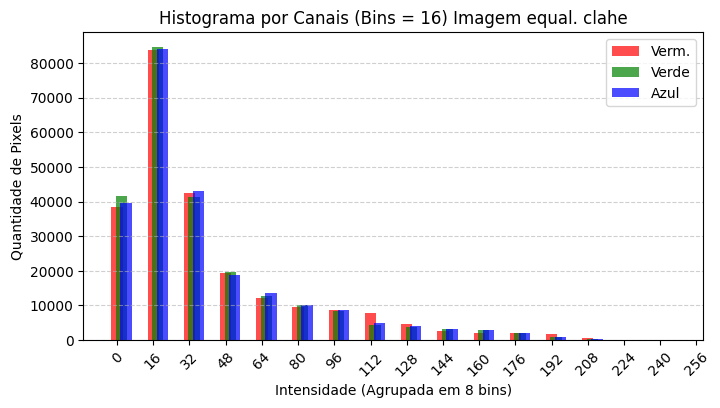

In [52]:
plot_histograma(img_color, titulo_extra="Imagem original")
plot_histograma(img_clahe2, titulo_extra="Imagem equal. clahe")


### Correção gamma

A Correção Gamma é uma técnica usada para ajustar o brilho de uma imagem de forma não linear.Diferente de simplesmente somar um valor ao brilho (que pode "estourar" os brancos), o Gamma manipula a relação entre o que a câmera captura (ou o computador gera) e como o olho humano percebe a luz.

Por que usar? Nossos olhos são mais sensíveis a mudanças em tons escuros do que em tons muito claros. A correção Gamma compensa isso:
- $\gamma < 1$ (Gamma Baixo): Expande os tons escuros, deixando as sombras mais visíveis (imagem fica mais clara).
- $\gamma > 1$ (Gamma Alto): Comprime os tons escuros, deixando a imagem mais "pesada" e escura.

In [53]:
def gamma_correction(img_uint8, gamma):
    lut = np.array([(i / 255.0) ** gamma * 255 for i in range(256)], dtype=np.uint8)
    return lut[img_uint8]   # indexação NumPy — muito rápida!


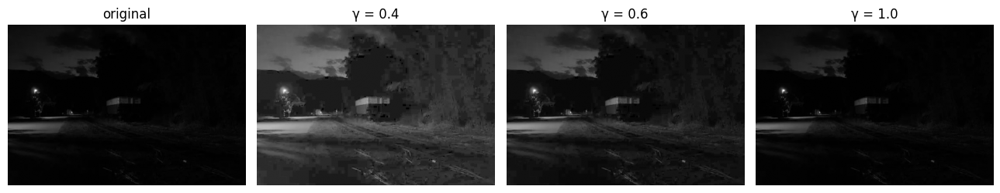

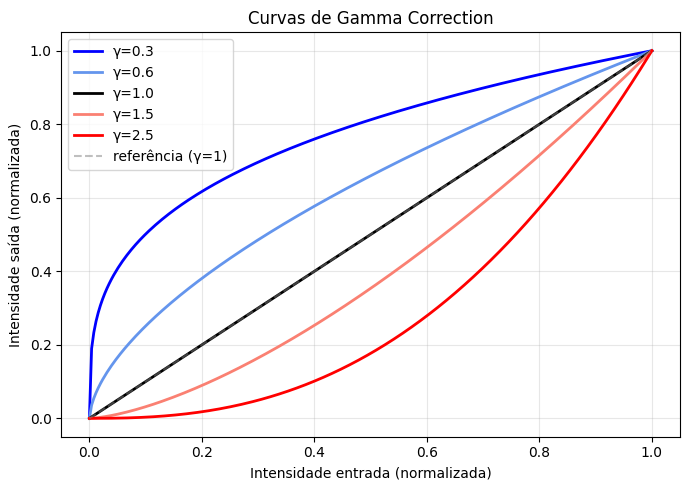

In [54]:
img_gray = cv2.cvtColor(cv2.imread('../images/imagem_histograma.png'), cv2.COLOR_BGR2GRAY)

gammas = [0.4, 0.6, 1.0]
lst_images = [gamma_correction(img_gray, g) for g in gammas]
titulos = [f'γ = {g}' for g in gammas]
show_image([img_gray]+lst_images, size=(13, 3), cmap='gray', axis='off', titulos=['original']+titulos)

x = np.linspace(0, 1, 256)
fig, ax = plt.subplots(figsize=(7, 5))
for g, cor in zip([0.3, 0.6, 1.0, 1.5, 2.5], ['blue', 'cornflowerblue', 'black', 'salmon', 'red']):
    ax.plot(x, x**g, label=f'γ={g}', color=cor, linewidth=2)
ax.plot([0,1],[0,1], '--', color='gray', alpha=0.5, label='referência (γ=1)')
ax.set_xlabel('Intensidade entrada (normalizada)')
ax.set_ylabel('Intensidade saída (normalizada)')
ax.set_title('Curvas de Gamma Correction')
ax.legend()
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()


## 5. Transformações Geométricas e Filtros


### 5.1 Filtros de convolução

Um **filtro** (ou *kernel*) é uma pequena matriz que é "deslizada" sobre a imagem. Em cada posição, fazemos uma multiplicação elemento a elemento entre o kernel e a região coberta, e somamos tudo — isso é a **convolução discreta 2D**.

<img src="../images/convolucao_discreta.png" width=600>

O centro do kernel é "ancorado" em cada pixel da imagem de entrada, os valores do
kernel e da imagem são multiplicados e o resultado gera a imagem de saída (na posição equivalente).

Existem outras variações dessa operação. Uma delas não permite que itens do kernel "sobrem" nas bordas. Num kernel
3x3 como o do exemplo, as multiplicações só ocorreriam a partir da segunda linha e segunda coluna da imagem.
A imagem resultante seria menor que a de entrada. E nesse caso, quanto maior o kernel, menor a imagem de saída.

In [55]:
#Exemplos de kenrel:
kernel_blur = np.ones((3, 3), np.float32) / 9
# se a soma do blur desse maior que 1 a imagem "ganharia brilho"

# Sharpen: Soma = 1 (Enfatiza o centro, subtrai vizinhos)
kernel_sharpen = np.array([
    [ 0, -1,  0],
    [-1,  5, -1],
    [ 0, -1,  0]
])

# Sobel Vertical: Soma = 0 (Detecta variações horizontais de intensidade)
kernel_sobel_v = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]
])


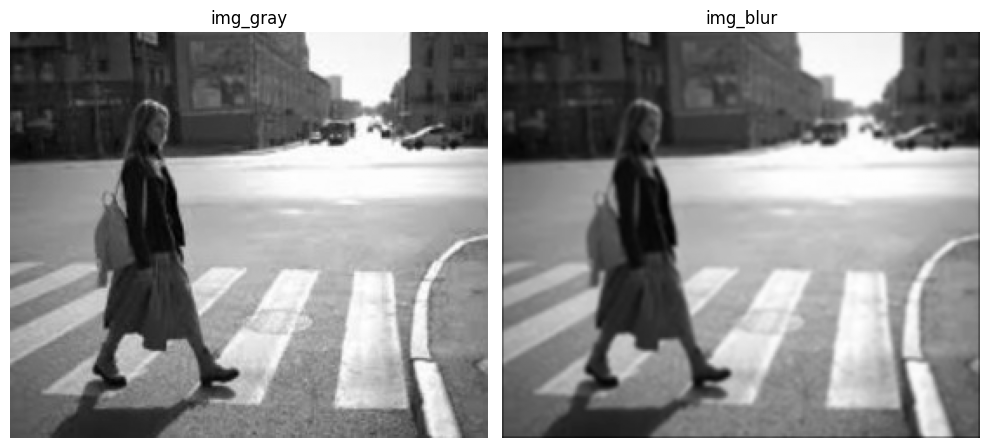

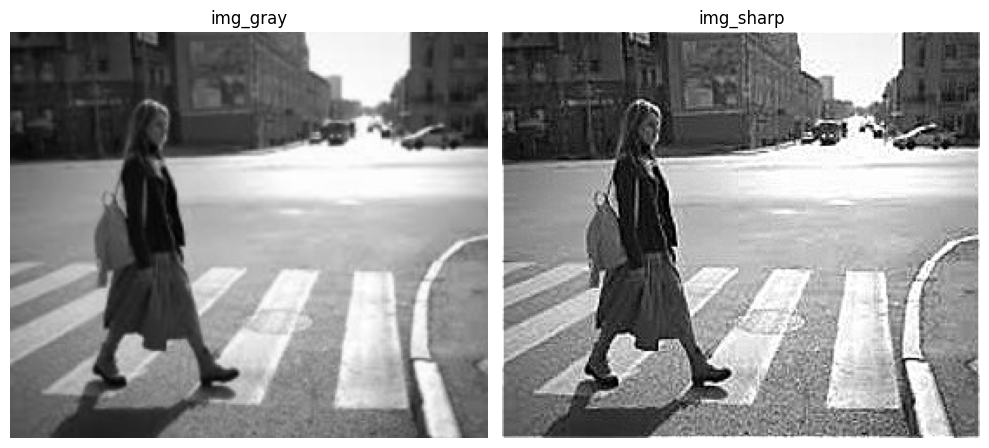

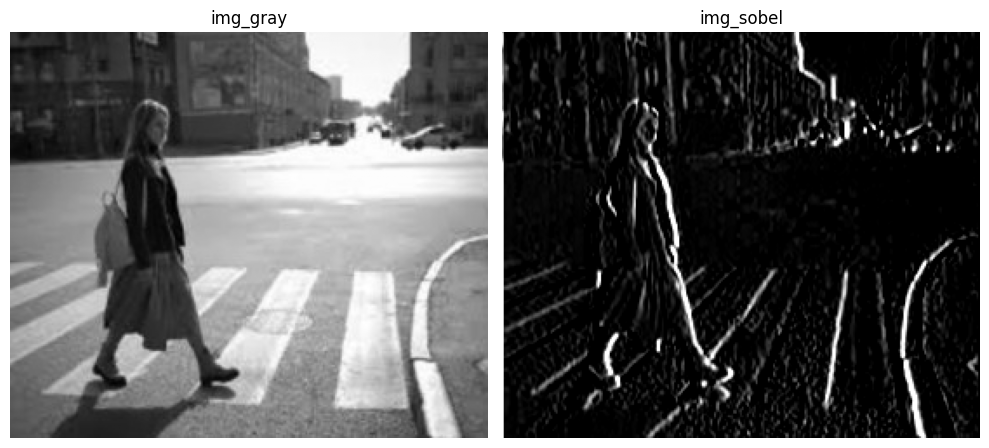

In [56]:
img_gray = cv2.cvtColor(cv2.imread('../images/mulher_faixa_pedestre.jpg'), cv2.COLOR_BGR2GRAY)

img_blur = cv2.filter2D(img_gray.astype(np.float32), -1, kernel_blur, borderType=cv2.BORDER_CONSTANT)
img_blur = np.clip(img_blur, 0, 255).astype(np.uint8)
img_sharp = cv2.filter2D(img_gray.astype(np.float32), -1, kernel_sharpen, borderType=cv2.BORDER_CONSTANT)
img_sharp = np.clip(img_sharp, 0, 255).astype(np.uint8)
img_sobel = cv2.filter2D(img_gray.astype(np.float32), -1, kernel_sobel_v, borderType=cv2.BORDER_CONSTANT)
img_sobel = np.clip(img_sobel, 0, 255).astype(np.uint8)

show_image([img_gray, img_blur], size=(10, 8), cmap='gray', axis='off', titulos=['img_gray', 'img_blur'])
show_image([img_gray, img_sharp], size=(10, 8), cmap='gray', axis='off', titulos=['img_gray', 'img_sharp'])
show_image([img_gray, img_sobel], size=(10, 8), cmap='gray', axis='off', titulos=['img_gray', 'img_sobel'])

Imagem original: (234, 275)
Resultado Valid (3x3): (232, 273)
Resultado com Stride 2 (2x2): (116, 137)


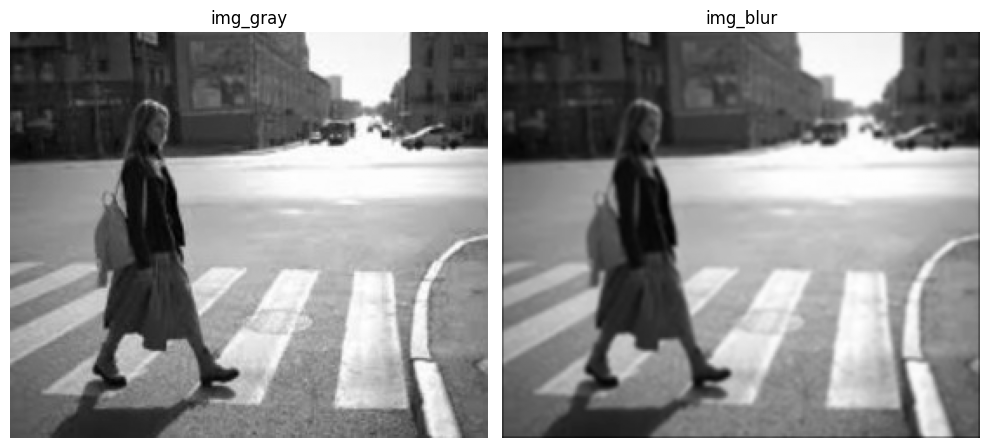

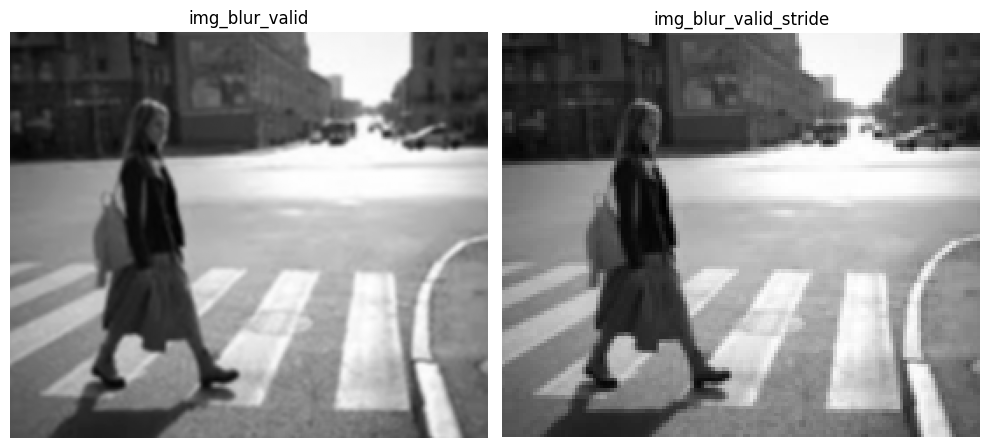

In [57]:
# Desconsiderando as bordas e dando "saltos" na convolucao (parametro stride)
kernel = kernel_blur
k_h, k_w = kernel.shape
borda_h = k_h // 2
borda_w = k_w // 2

img_gray = cv2.cvtColor(cv2.imread('../images/mulher_faixa_pedestre.jpg'), cv2.COLOR_BGR2GRAY)
img_blur = cv2.filter2D(img_gray.astype(np.float32), -1, kernel_blur, borderType=cv2.BORDER_CONSTANT)
img_blur = np.clip(img_blur, 0, 255).astype(np.uint8)
img_blur_valid = img_blur[borda_h:-borda_h, borda_w:-borda_w]
stride = 2
img_blur_valid_stride = img_blur_valid[::stride, ::stride]

print("Imagem original:", img_gray.shape)
print("Resultado Valid (3x3):", img_blur_valid.shape)
print("Resultado com Stride 2 (2x2):", img_blur_valid_stride.shape)

show_image([img_gray, img_blur], size=(10, 8), cmap='gray', axis='off', titulos=['img_gray', 'img_blur'])
show_image([img_blur_valid, img_blur_valid_stride], size=(10, 8), cmap='gray', axis='off', titulos=['img_blur_valid', 'img_blur_valid_stride'])


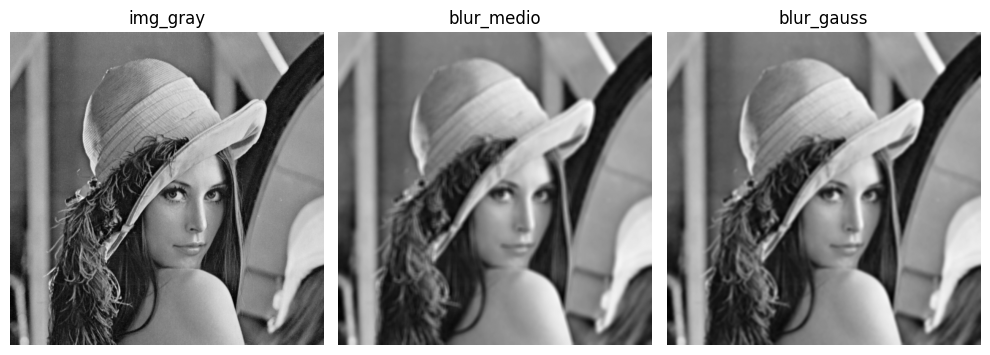

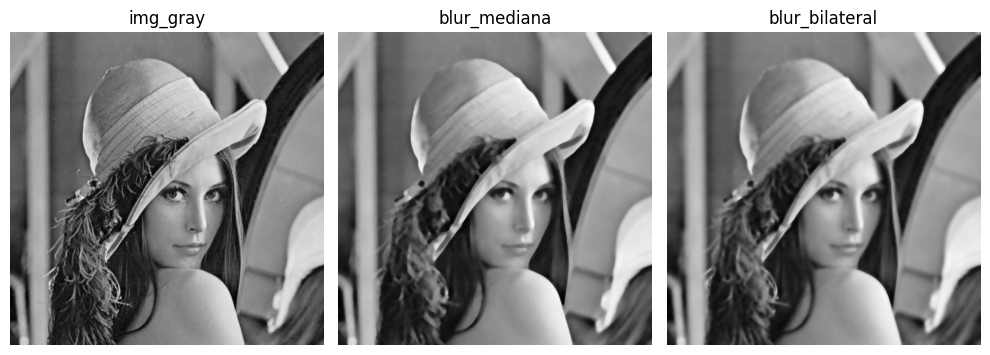

💡 Blur Bilateral  borra regiões uniformes mas respeita bordas — popular em apps de beleza.


In [58]:
# outros exemplos de suavização (blur)

img_gray = cv2.cvtColor(cv2.imread('../images/lenna.png'), cv2.COLOR_BGR2GRAY)
# Blur médio (box filter) — todos os pesos iguais
blur_medio = cv2.blur(img_gray, (7, 7))
# Blur gaussiano — pesos maiores no centro, segue distribuição gaussiana
blur_gauss = cv2.GaussianBlur(img_gray, (7, 7), sigmaX=2)
# Blur mediano — substitui cada pixel pela mediana dos vizinhos
# Muito bom para remover ruído sal e pimenta (pontos pretos e brancos)
blur_mediana = cv2.medianBlur(img_gray, 7)
# Blur bilateral — borra mas preserva bordas!
blur_bilateral = cv2.bilateralFilter(img_gray, d=9, sigmaColor=75, sigmaSpace=75)

show_image([img_gray, blur_medio, blur_gauss,], size=(10, 4), cmap='gray', axis='off', titulos=['img_gray', 'blur_medio', 'blur_gauss'])
show_image([img_gray, blur_mediana, blur_bilateral], size=(10, 4), cmap='gray', axis='off', titulos=['img_gray', 'blur_mediana', 'blur_bilateral'])

print('💡 Blur Bilateral  borra regiões uniformes mas respeita bordas — popular em apps de beleza.')

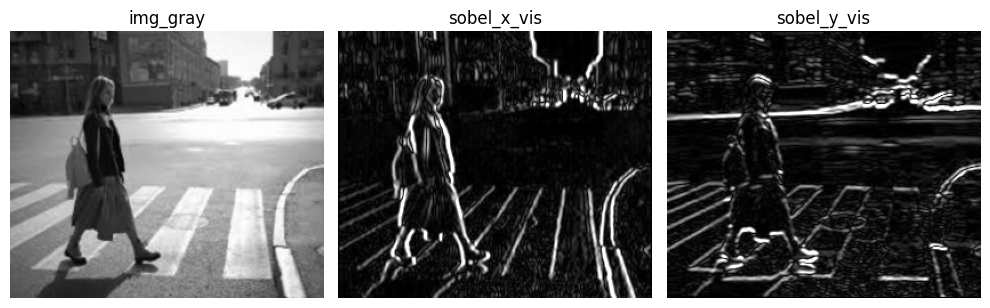

In [59]:
# outros exemplos de detecção de borda (Sobel)
img_gray = cv2.cvtColor(cv2.imread('../images/mulher_faixa_pedestre.jpg'), cv2.COLOR_BGR2GRAY)
img_blur = cv2.GaussianBlur(img_gray, (3, 3), 0)   # suavizar antes do Sobel

# Sobel calcula a derivada (gradiente) em X ou Y
# ddepth=-1 mantém o mesmo tipo da entrada
# ksize=3 é o tamanho do kernel (3, 5 ou 7)
sobel_x  = cv2.Sobel(img_blur, cv2.CV_64F, dx=1, dy=0, ksize=3)  # bordas verticais
sobel_y  = cv2.Sobel(img_blur, cv2.CV_64F, dx=0, dy=1, ksize=3)  # bordas horizontais

# Magnitude do gradiente = sqrt(Gx² + Gy²)
magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
magnitude = np.uint8(np.clip(magnitude, 0, 255))

# Converter para uint8 para exibição
sobel_x_vis = cv2.convertScaleAbs(sobel_x)
sobel_y_vis = cv2.convertScaleAbs(sobel_y)

show_image([img_gray, sobel_x_vis, sobel_y_vis,], size=(10, 4), cmap='gray', axis='off', 
        titulos=['img_gray', 'sobel_x_vis', 'sobel_y_vis'])


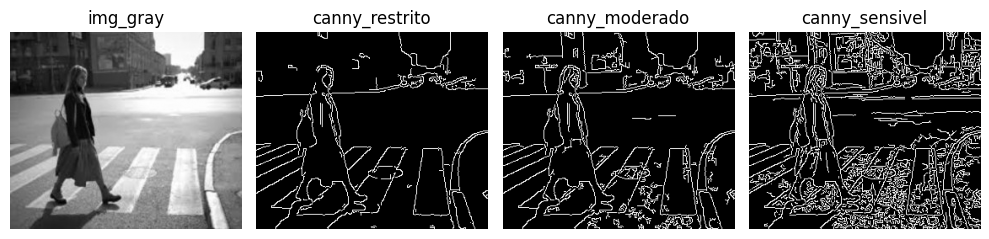

In [60]:
# exemplos de detecção de bordas (Canny)
img_gray = cv2.cvtColor(cv2.imread('../images/mulher_faixa_pedestre.jpg'), cv2.COLOR_BGR2GRAY)

# Canny(imagem, threshold_baixo, threshold_alto)
# - pixels com gradiente > threshold_alto → borda forte (mantido)
# - pixels com gradiente < threshold_baixo → descartado
# - pixels no meio → mantido SOMENTE se conectado a uma borda forte
canny_restrito = cv2.Canny(img_gray, threshold1=100, threshold2=200)
canny_moderado = cv2.Canny(img_gray, threshold1=50,  threshold2=150)
canny_sensivel = cv2.Canny(img_gray, threshold1=20,  threshold2=80)
show_image([img_gray, canny_restrito, canny_moderado, canny_sensivel], size=(10, 4), cmap='gray', axis='off', 
        titulos=['img_gray', 'canny_restrito', 'canny_moderado', 'canny_sensivel'])



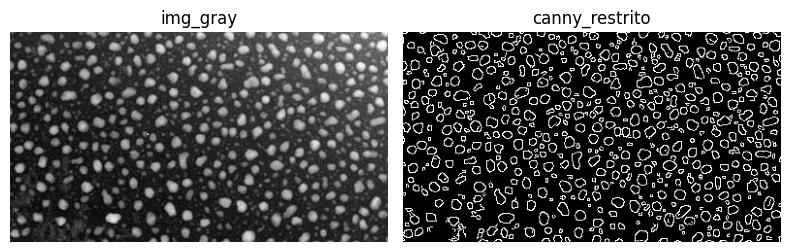

In [61]:
img_gray = cv2.cvtColor(cv2.imread('../images/morfologico.png'), cv2.COLOR_BGR2GRAY)
canny_restrito = cv2.Canny(img_gray, threshold1=100, threshold2=200)
show_image([img_gray, canny_restrito], size=(8, 4), cmap='gray', axis='off', titulos=['img_gray', 'canny_restrito'])

## 6. Operadores Morfológicos

**Morfologia matemática** é um conjunto de operações que processam imagens com base na **forma** dos objetos. Originalmente desenvolvida para imagens binárias (preto e branco), funciona também em imagens em tons de cinza.

O conceito central é o **elemento estruturante** (kernel morfológico) — uma forma geométrica (quadrado, círculo, cruz etc.) que "sonda" a imagem e decide o que manter, expandir ou contrair.

### As 4 operações fundamentais

| Operação | O que faz | Efeito visual |
|---|---|---|
| **Erosão** | Remove pixels nas bordas dos objetos | Objetos encolhem, detalhes pequenos somem |
| **Dilatação** | Adiciona pixels nas bordas dos objetos | Objetos crescem, buracos internos fecham |
| **Abertura** (erosão → dilatação) | Remove objetos pequenos, mantém grandes | Limpa ruído, separa objetos conectados |
| **Fechamento** (dilatação → erosão) | Fecha buracos, une objetos próximos | Preenche gaps, suaviza contornos |

💡 Uma das operações básicas é a binarização.

### Aplicações práticas
- Remoção de ruído em imagens binarizadas (após threshold)
- Separação de objetos que se tocam
- Preenchimento de buracos em máscaras de segmentação
- Extração de esqueleto de objetos (skeletonization)
- Detecção de linhas e grades

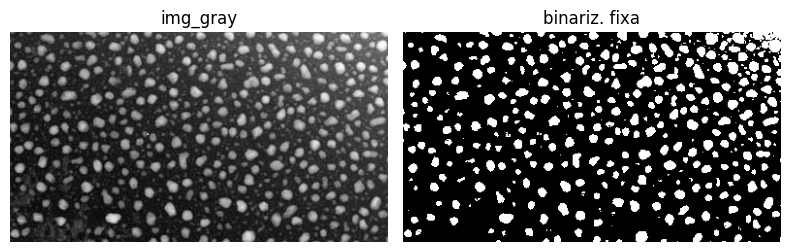

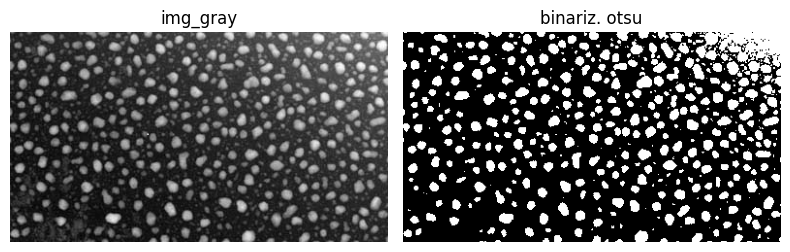

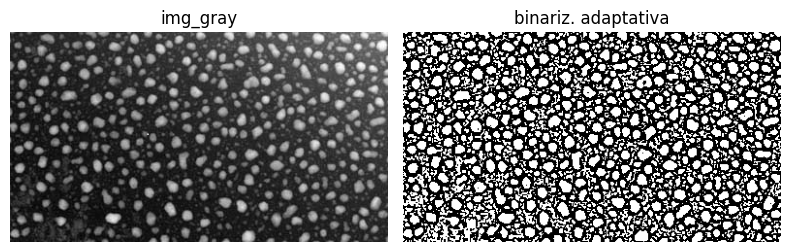

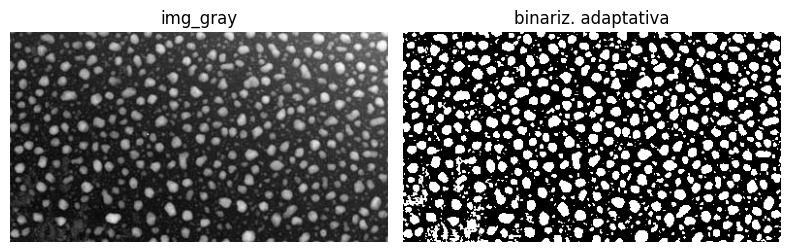

In [62]:
img_gray = cv2.cvtColor(cv2.imread('../images/morfologico.png'), cv2.COLOR_BGR2GRAY)

# binarizacao fixa
_, bin_fixo = cv2.threshold(img_gray, 127, 255, cv2.THRESH_BINARY)
show_image([img_gray, bin_fixo], size=(8, 4), cmap='gray', axis='off', titulos=['img_gray', 'binariz. fixa'])

# binarizacao otsu - encontra o melhor threshold automaticamente, minimizando variância intraclasse
t_otsu, bin_otsu = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
show_image([img_gray, bin_otsu], size=(8, 4), cmap='gray', axis='off', titulos=['img_gray', 'binariz. otsu'])

# binariz. com limite adaptativo: cada região usa seu próprio threshold (bom para iluminação não uniforme)
bin_adaptativo = cv2.adaptiveThreshold(img_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
show_image([img_gray, bin_adaptativo], size=(8, 4), cmap='gray', axis='off', titulos=['img_gray', 'binariz. adaptativa'])

# binariz. com limite adaptativo: cada região usa seu próprio threshold (bom para iluminação não uniforme)
bin_adaptativo = cv2.adaptiveThreshold(img_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 35, 1)
show_image([img_gray, bin_adaptativo], size=(8, 4), cmap='gray', axis='off', titulos=['img_gray', 'binariz. adaptativa'])


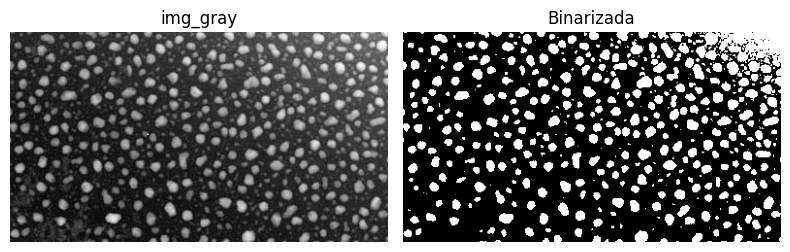

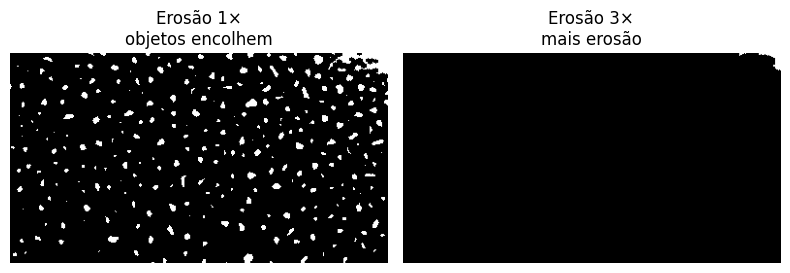

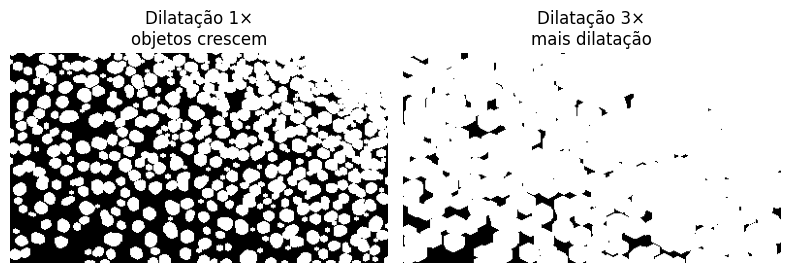

In [63]:
img_gray = cv2.cvtColor(cv2.imread('../images/morfologico.png'), cv2.COLOR_BGR2GRAY)
_, img_bin = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Criar elementos estruturantes
kernel_3 = cv2.getStructuringElement(cv2.MORPH_RECT,    (3, 3))   # quadrado 3×3
kernel_5 = cv2.getStructuringElement(cv2.MORPH_RECT,    (5, 5))   # quadrado 5×5
kernel_e = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))   # elipse
kernel_c = cv2.getStructuringElement(cv2.MORPH_CROSS,   (5, 5))   # cruz

# print('tire comentários e visualize os elementos')
# print('Quadrado 3×3:\n', kernel_3)
# print('\nElipse 5×5:\n', kernel_e)
# print('\nCruz 5×5:\n', kernel_c)

show_image([img_gray, img_bin], size=(8, 4), cmap='gray', axis='off', 
        titulos=['img_gray', 'Binarizada',])

# Erosão — itera=1 significa aplicar o kernel 1 vez
erosao_1 = cv2.erode(img_bin, kernel_e, iterations=1)
erosao_3 = cv2.erode(img_bin, kernel_e, iterations=3)
show_image([erosao_1, erosao_3], size=(8, 4), cmap='gray', axis='off', 
        titulos=['Erosão 1×\nobjetos encolhem', 'Erosão 3×\nmais erosão'])

# Dilatação
dilatacao_1 = cv2.dilate(img_bin, kernel_e, iterations=1)
dilatacao_3 = cv2.dilate(img_bin, kernel_e, iterations=3)
show_image([dilatacao_1, dilatacao_3], size=(8, 4), cmap='gray', axis='off', 
        titulos=['Dilatação 1×\nobjetos crescem', 'Dilatação 3×\nmais dilatação'])


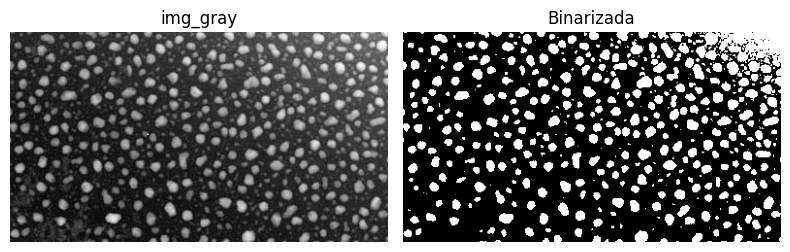

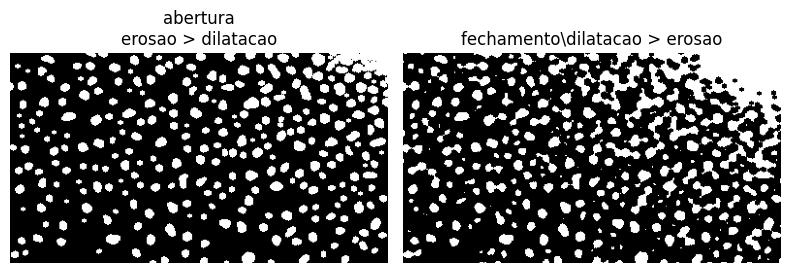

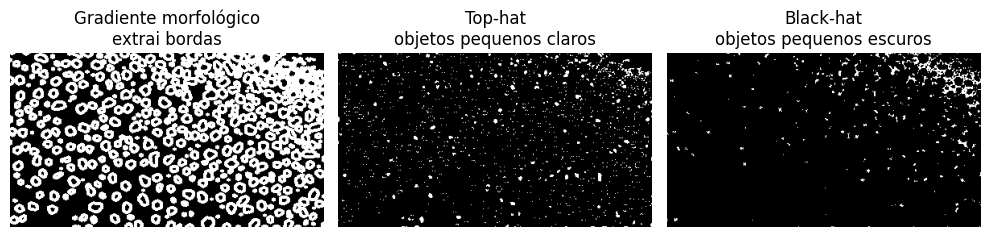

In [64]:
# abertura fechamento e operações avançadas

img_gray = cv2.cvtColor(cv2.imread('../images/morfologico.png'), cv2.COLOR_BGR2GRAY)
_, img_bin = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

show_image([img_gray, img_bin], size=(8, 4), cmap='gray', axis='off', 
        titulos=['img_gray', 'Binarizada',])


kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))

# Abertura = erosão seguida de dilatação
# Remove objetos pequenos (ruído), mantém grandes
img_abertura = cv2.morphologyEx(img_bin, cv2.MORPH_OPEN, kernel)

# Fechamento = dilatação seguida de erosão
# Fecha buracos internos, une objetos próximos
img_fechamento = cv2.morphologyEx(img_bin, cv2.MORPH_CLOSE, kernel)

show_image([img_abertura, img_fechamento], size=(8, 4), cmap='gray', axis='off', 
        titulos=['abertura\nerosao > dilatacao', 'fechamento\dilatacao > erosao',])

# Gradiente morfológico = dilatação - erosão = extrai bordas dos objetos
gradiente = cv2.morphologyEx(img_bin, cv2.MORPH_GRADIENT, kernel)

# Top-hat = original - abertura = realça objetos pequenos e claros
tophat = cv2.morphologyEx(img_bin, cv2.MORPH_TOPHAT, kernel)

# Black-hat = fechamento - original = realça objetos pequenos e escuros
blackhat = cv2.morphologyEx(img_bin, cv2.MORPH_BLACKHAT, kernel)

show_image([gradiente, tophat, blackhat], size=(10, 4), cmap='gray', axis='off', 
        titulos=['Gradiente morfológico\nextrai bordas', 'Top-hat\nobjetos pequenos claros', 
        'Black-hat\nobjetos pequenos escuros'])



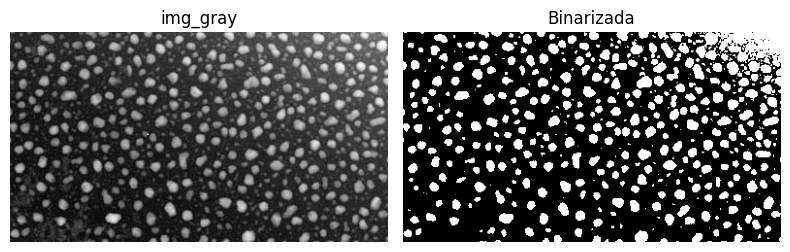

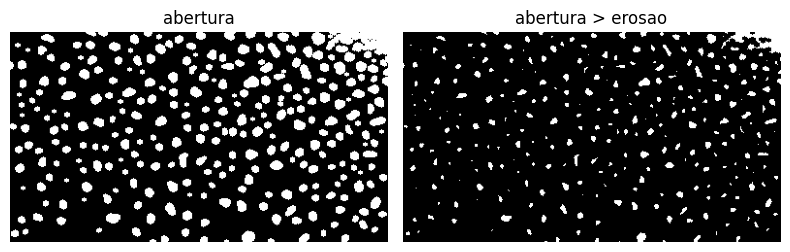

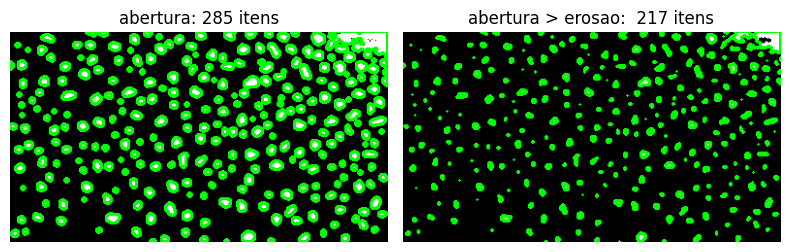

In [65]:
img_gray = cv2.cvtColor(cv2.imread('../images/morfologico.png'), cv2.COLOR_BGR2GRAY)
_, img_bin = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
show_image([img_gray, img_bin], size=(8, 4), cmap='gray', axis='off', 
        titulos=['img_gray', 'Binarizada',])

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
img_abertura = cv2.morphologyEx(img_bin, cv2.MORPH_OPEN, kernel)
cv2.imwrite(f"../images/morfologico_a.png", img_abertura)

img_abertura_erosao = cv2.erode(img_abertura, kernel_e, iterations=1)
cv2.imwrite(f"../images/morfologico_ae.png", img_abertura)


show_image([img_abertura, img_abertura_erosao], size=(8, 4), cmap='gray', axis='off', 
        titulos=['abertura', 'abertura > erosao',])

contornos_ab, _ = cv2.findContours(img_abertura, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
output_abert = cv2.cvtColor(img_abertura, cv2.COLOR_GRAY2BGR)
cv2.drawContours(output_abert, contornos_ab, -1, (0, 255, 0), 2) 

contornos_ab_erosao, _ = cv2.findContours(img_abertura_erosao, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
output_abert_erosao = cv2.cvtColor(img_abertura_erosao, cv2.COLOR_GRAY2BGR)
cv2.drawContours(output_abert_erosao, contornos_ab_erosao, -1, (0, 255, 0), 2) 

show_image([output_abert, output_abert_erosao], size=(8, 4), cmap='gray', axis='off', 
        titulos=[f'abertura: {len(contornos_ab)} itens', f'abertura > erosao:  {len(output_abert_erosao)} itens',])



### Exercícios propostos

1. Carregue uma imagem sua e calcule o histograma de cada canal RGB. Identifique se a imagem está sub ou superexposta.
2. Implemente uma função que receba uma imagem e retorne ela redimensionada para 224×224 com padding mantendo a proporção original (letterbox).
3. Aplique a segmentação por cor HSV para isolar um objeto de cor específica em uma foto sua.
4. Compare visualmente a diferença entre Sobel, Canny e Gradiente Morfológico na mesma imagem.
5. Construa um pipeline completo: leia uma imagem → grayscale → blur gaussiano → Canny → morfologia para limpar → encontrar e desenhar contornos.